# Qiskit Improvements IBM Quantum Summit 2022

* Matthew Treinish: matthew.treinish@Ibm.com

This tutorial will cover the improvements made to the core of Qiskit over the past year. It concentrates on improvements made to Qiskit's compiler, how it interfaces with hardware, and some developments in the `QuantumCircuit` class.

This is running the latest released version of Qiskit Terra:

In [1]:
import qiskit

print(qiskit.__version__)

0.21.2


## Transpiler Plugins and Composition

The Qiskit transpiler now supports a certain degree of pluggability and composability that wasn't possible before.

### `StagedPassManager`

First is the introduction of the `StagedPassManager` it adds a concept of stages to the `PassManager` (the data structure which manages the pipeline of passes to analyze and transform a circuit)

In [2]:
from qiskit.transpiler.passes import *
from qiskit.transpiler import PassManager, StagedPassManager

basis_gates = ["rx", "ry", "rxx"]
init = PassManager([UnitarySynthesis(basis_gates, min_qubits=3), Unroll3qOrMore()])
translate = PassManager(
    [
        Collect2qBlocks(),
        ConsolidateBlocks(basis_gates=basis_gates),
        UnitarySynthesis(basis_gates),
    ]
)

staged_pm = StagedPassManager(
    stages=["init", "translation"], init=init, translation=translate
)

In [3]:
print(staged_pm.stages)

('init', 'translation')


In [4]:
staged_pm.draw()

MissingOptionalLibraryError: "The 'graphviz' library is required to use 'pass_manager_drawer'. You can install it with ''brew install graphviz' if on Mac, or by downloding it from their website'."

Stages have an implicitly created `pre_` and `post_` stage that run before and after each defined stage. This provides extra flexability if passes need to be run between stages

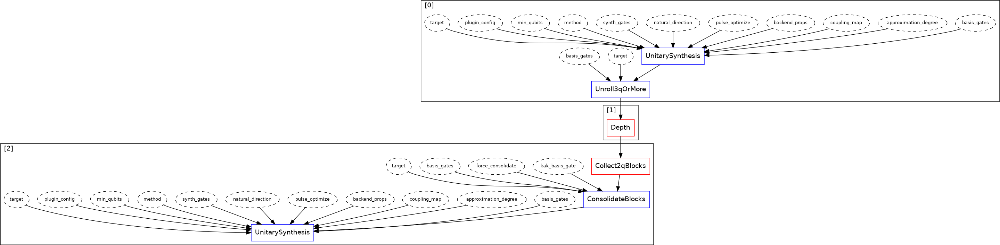

In [5]:
from qiskit.transpiler.preset_passmanagers import common
from qiskit.transpiler import CouplingMap
cmap = CouplingMap.from_grid(2, 2)
staged_pm.pre_layout = common.generate_unroll_3q(None, ['u', 'cx'])
staged_pm.post_layout = common.generate_pre_op_passmanager(coupling_map=cmap)
staged_pm.pre_translation = PassManager(Depth())
staged_pm.draw()

While stages provide composibility and a high level structure/flow to the pass manager, they do restrict how we can interact with them. Instead of being able to modify and add passes to the `StagedPassManager` directly this now has to happen at the individual stage. So for example if you wanted to add a pass to the end of the execution you would have to do this at the end of the last stage.

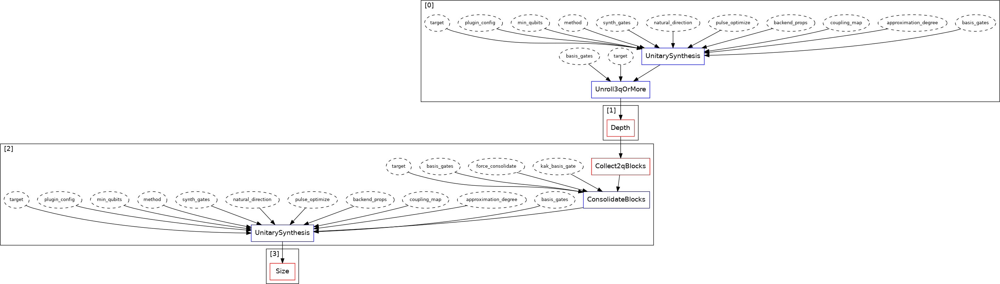

In [6]:
staged_pm.translation.append(Size())
staged_pm.draw()

### Working with Preset Pass Managers

While being able to label your own stages provides nice flexibility and composability options to interacting with `PassManager`s the real power of this interface comes with working with the preset pass managers, or those that get used internally by the `transpile()` function.

It's now much easier to create preset pass managers, there is a new generator function `generate_preset_pass_managers()` which has the same signature as `transpile()`. To ease in working with and modifying the preset pass manager the preset pass managers are now all `StagedPassManager`s.

In [7]:
from qiskit.transpiler.preset_passmanagers import generate_preset_pass_manager
from qiskit.providers.fake_provider import FakeBelemV2
backend = FakeBelemV2()
pm = generate_preset_pass_manager(3, backend)
print(type(pm))

<class 'qiskit.transpiler.passmanager.StagedPassManager'>


In [8]:
print(pm.stages)

('init', 'layout', 'routing', 'translation', 'optimization', 'scheduling')


These stages are the same as the default stages if you instantiate a `StagedPassManager` without any stages defined explicitly

In [9]:
print(StagedPassManager().stages)

('init', 'layout', 'routing', 'translation', 'optimization', 'scheduling')


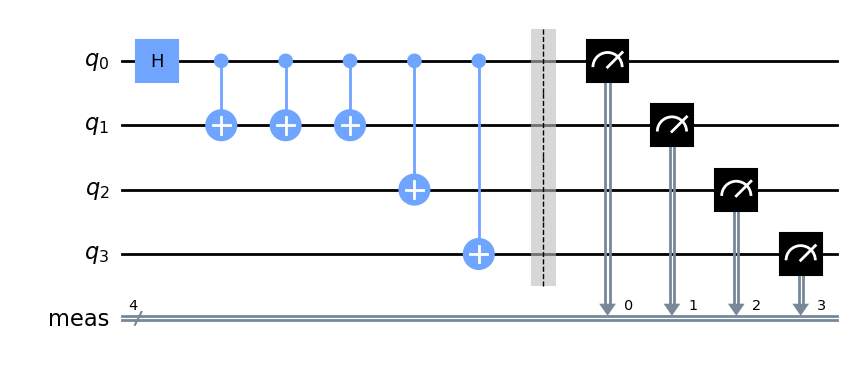

In [10]:
from qiskit.circuit import QuantumCircuit

# Build GHZ state circuit with extra CNOTs
circuit = QuantumCircuit(4)
circuit.h(0)
circuit.cx(0, 1)
circuit.cx(0, 1)
circuit.cx(0, 1)
circuit.cx(0, 2)
circuit.cx(0, 3)
circuit.measure_all()
circuit.draw('mpl')

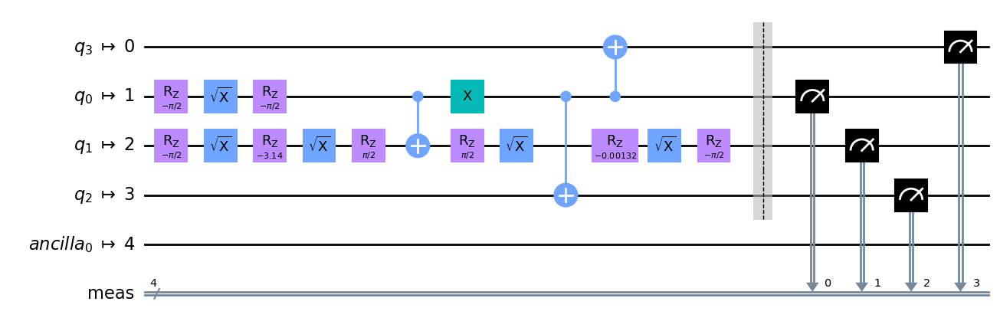

In [11]:
pm.run(circuit).draw('mpl')

Having these stages defined make it trivial to replace or modify a section of the preset pass managers to use a normal/default workflow with some tweaks. For example, lets add some logical optimization (CNOT and inverse cancellation) prior to running layout and then also run dynamical decoupling for scheduling:

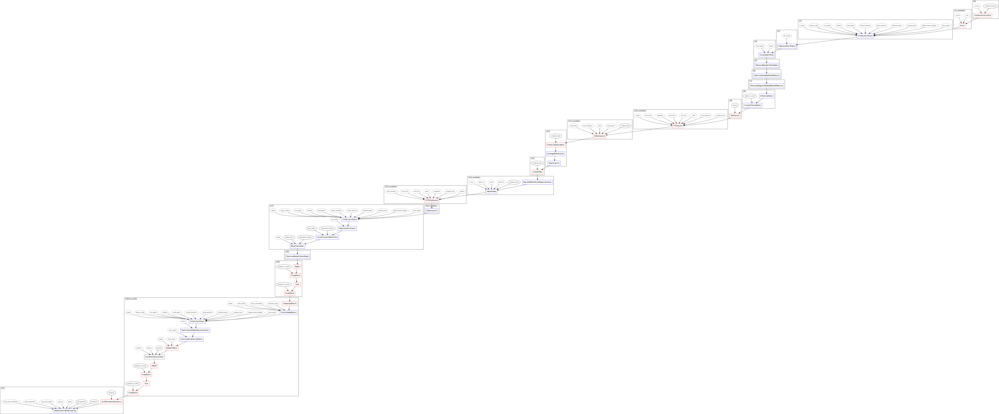

In [12]:
from qiskit.circuit.library import XGate, HGate, RXGate, PhaseGate, TGate, TdgGate
import numpy as np

backend_durations = backend.target.durations()

dd_sequence = [XGate(), XGate()]

scheduling_pm = PassManager([
    ALAPScheduleAnalysis(backend_durations),
    PadDynamicalDecoupling(backend_durations, dd_sequence),
])

inverse_gate_list = [
    HGate(),
    (RXGate(np.pi / 4), RXGate(-np.pi / 4)),
    (PhaseGate(np.pi / 4), PhaseGate(-np.pi / 4)),
    (TGate(), TdgGate()),
]

logical_opt = PassManager([
    CXCancellation(),
    InverseCancellation([HGate(), (RXGate(np.pi / 4), RXGate(-np.pi / 4))])
])

# Run DD for scheduling stage
pm.scheduling = scheduling_pm
# Run  logical optimization prior to layout stage
pm.pre_layout = logical_opt
pm.draw()

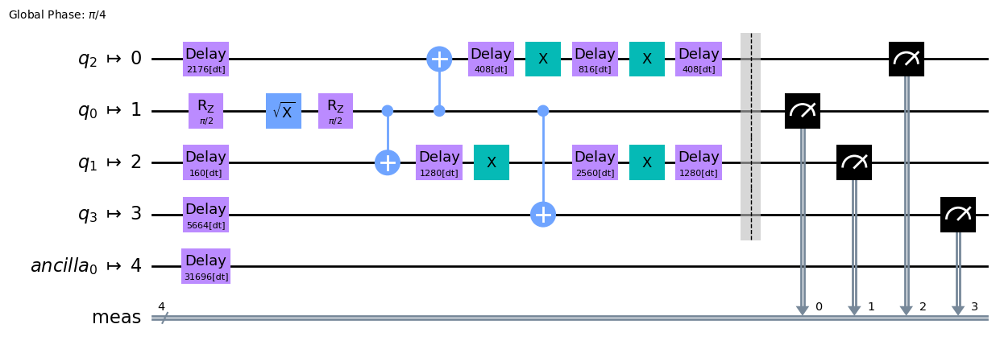

In [13]:
pm.run(circuit).draw('mpl')

We can see this in progress too, by printing the stage and output of each pass run using a callback:

After: <qiskit.transpiler.passes.utils.contains_instruction.ContainsInstruction object at 0x7f29f9d9db50>


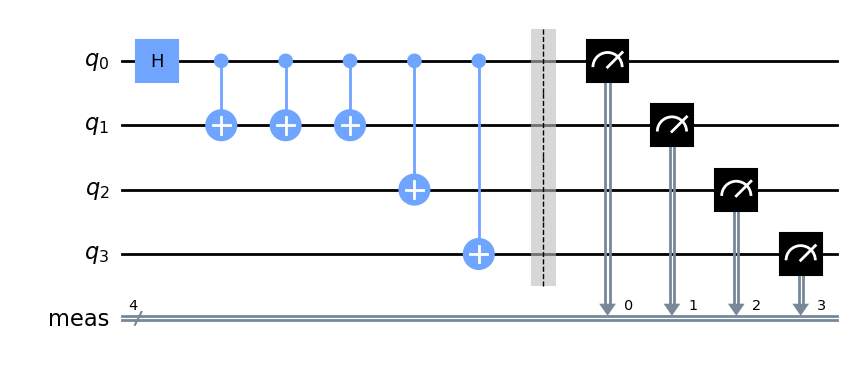

After: <qiskit.transpiler.passes.synthesis.unitary_synthesis.UnitarySynthesis object at 0x7f29f9e2c890>


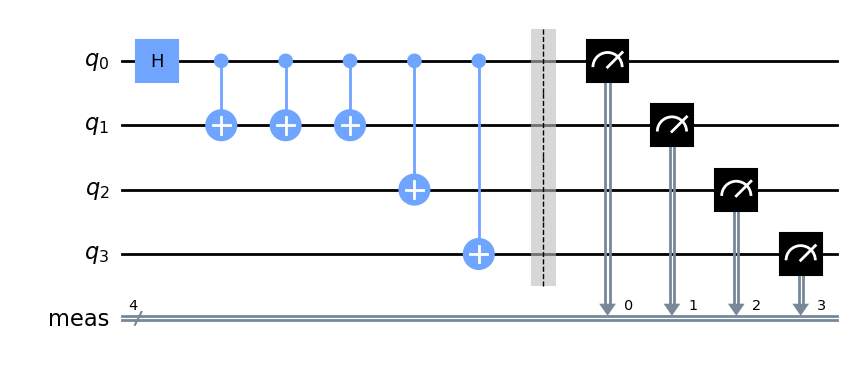

After: <qiskit.transpiler.passes.synthesis.high_level_synthesis.HighLevelSynthesis object at 0x7f29f9de39d0>


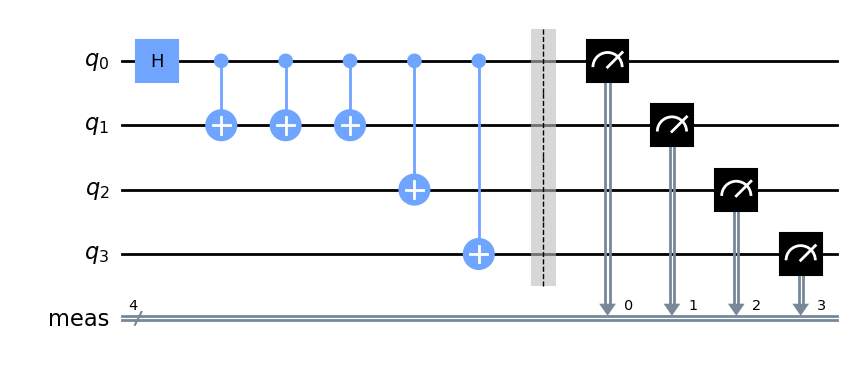

After: <qiskit.transpiler.passes.basis.unroll_3q_or_more.Unroll3qOrMore object at 0x7f29f9de3750>


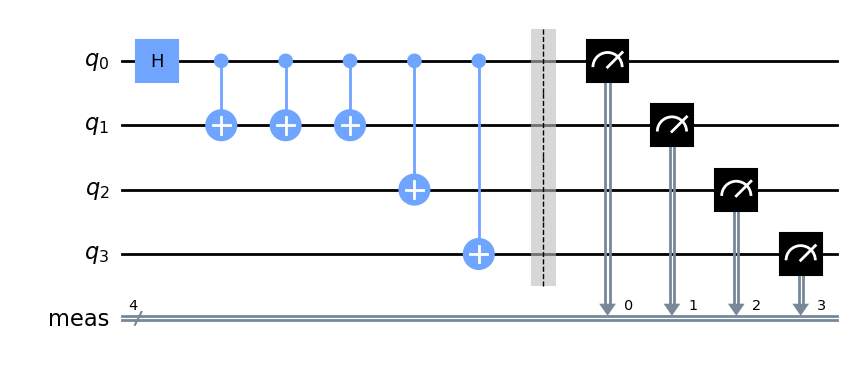

After: <qiskit.transpiler.passes.optimization.remove_reset_in_zero_state.RemoveResetInZeroState object at 0x7f29f9dcb350>


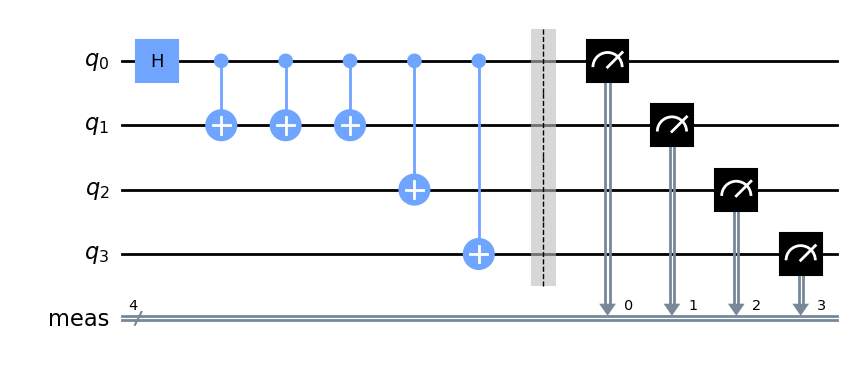

After: <qiskit.transpiler.passes.optimization.optimize_swap_before_measure.OptimizeSwapBeforeMeasure object at 0x7f29f9da9ed0>


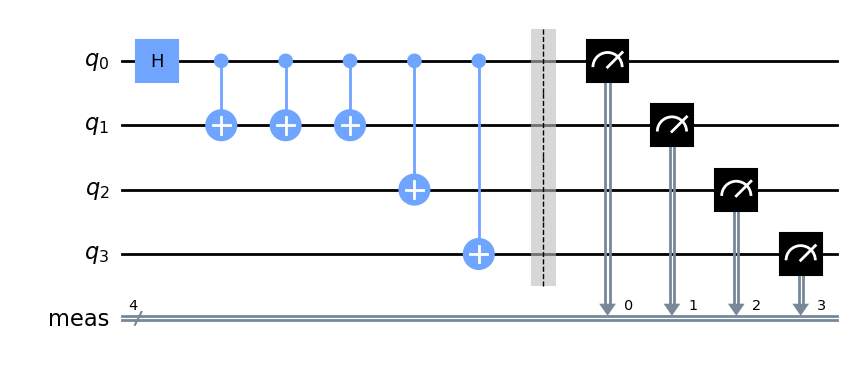

After: <qiskit.transpiler.passes.optimization.remove_diagonal_gates_before_measure.RemoveDiagonalGatesBeforeMeasure object at 0x7f29f9de3b90>


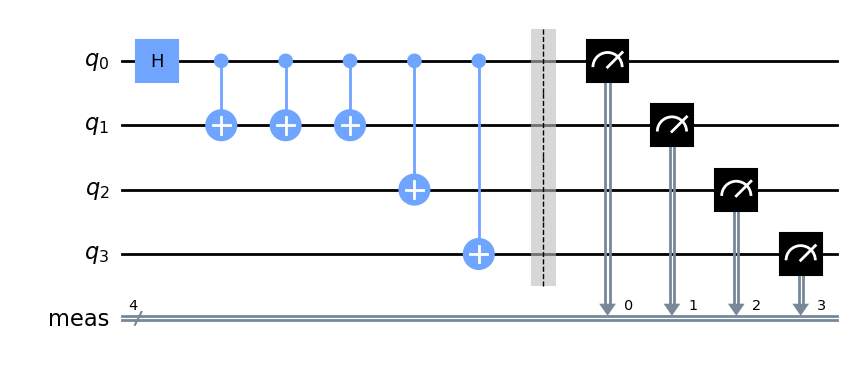

After: <qiskit.transpiler.passes.optimization.cx_cancellation.CXCancellation object at 0x7f29b8e07790>


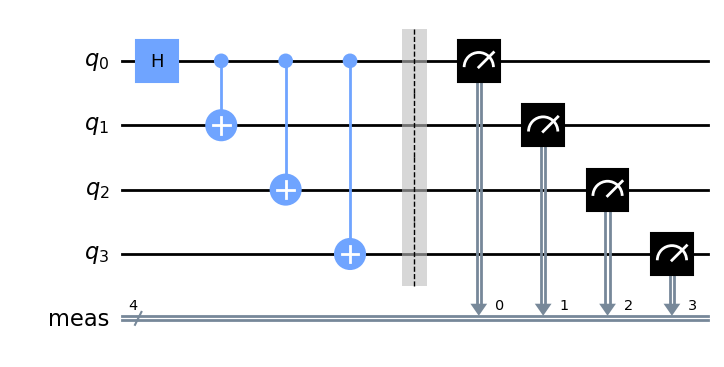

After: <qiskit.transpiler.passes.optimization.inverse_cancellation.InverseCancellation object at 0x7f29b8e14c50>


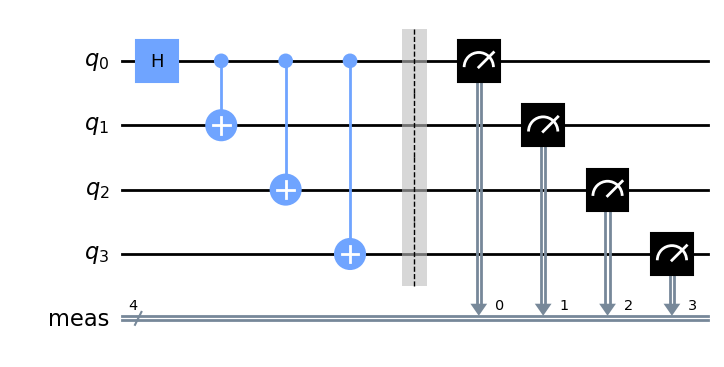

After: <qiskit.transpiler.passes.layout.set_layout.SetLayout object at 0x7f2a73e903d0>


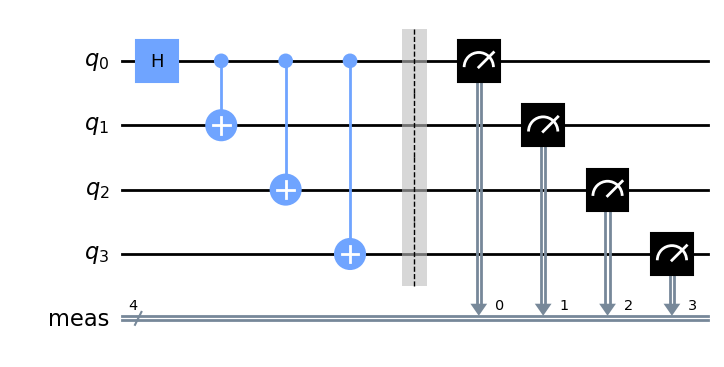

After: <qiskit.transpiler.passes.layout.vf2_layout.VF2Layout object at 0x7f29fa61ca90>


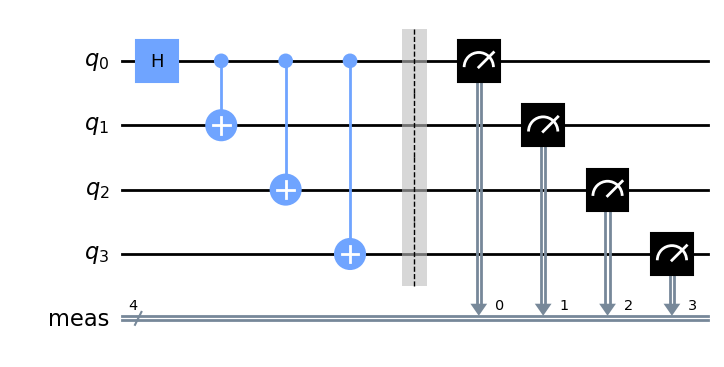

After: <qiskit.transpiler.passes.layout.full_ancilla_allocation.FullAncillaAllocation object at 0x7f29f9dfc050>


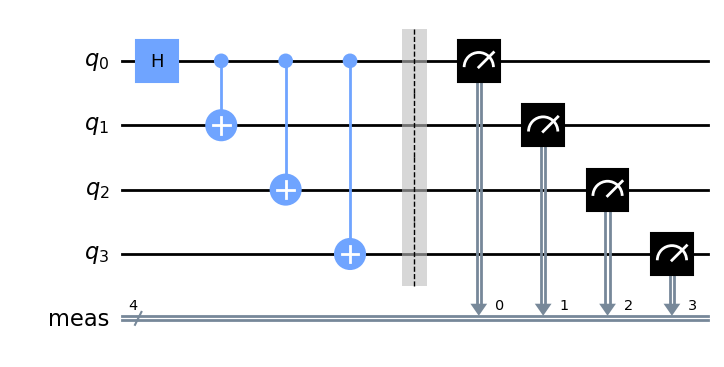

After: <qiskit.transpiler.passes.layout.enlarge_with_ancilla.EnlargeWithAncilla object at 0x7f29f9dfc290>


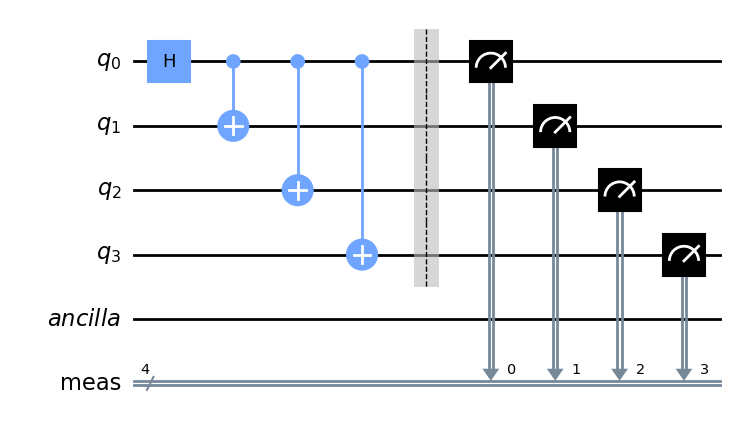

After: <qiskit.transpiler.passes.layout.apply_layout.ApplyLayout object at 0x7f29f9dfc350>


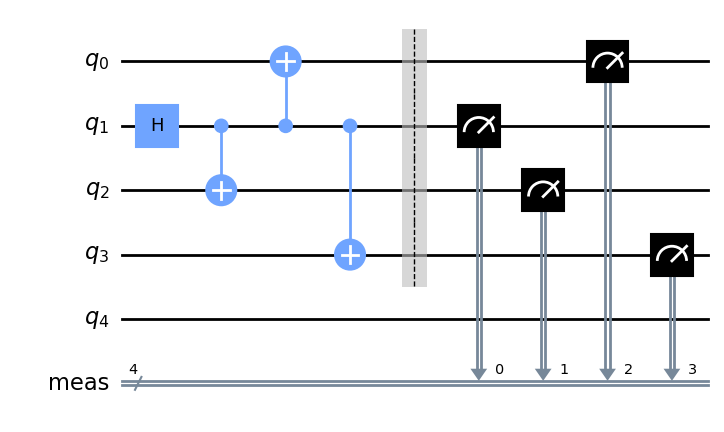

After: <qiskit.transpiler.passes.utils.check_map.CheckMap object at 0x7f29f9dd7ed0>


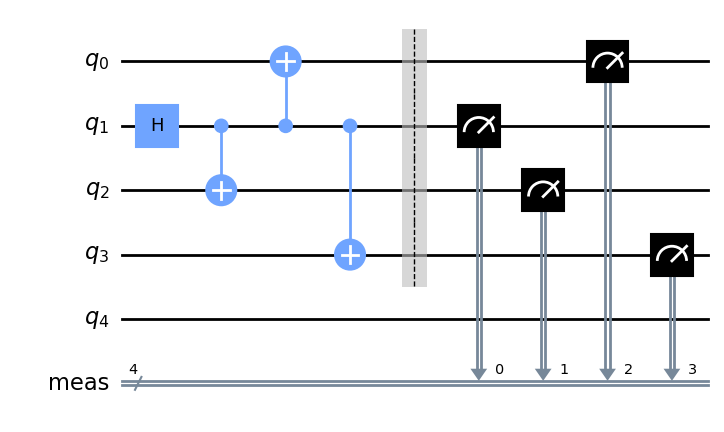

After: <qiskit.transpiler.passes.synthesis.unitary_synthesis.UnitarySynthesis object at 0x7f29f9dfc410>


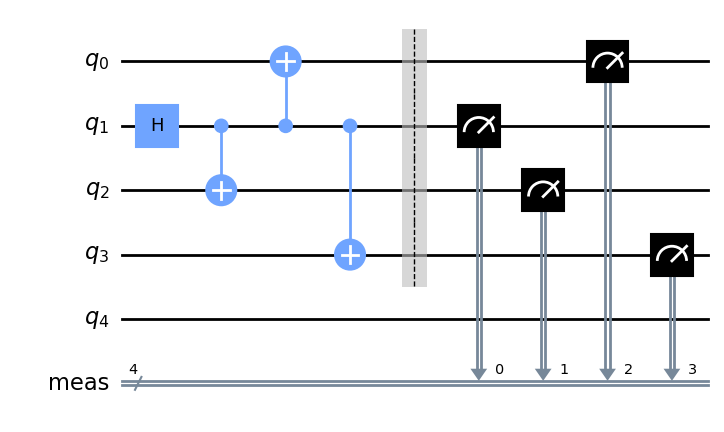

After: <qiskit.transpiler.passes.synthesis.high_level_synthesis.HighLevelSynthesis object at 0x7f29f9dfc790>


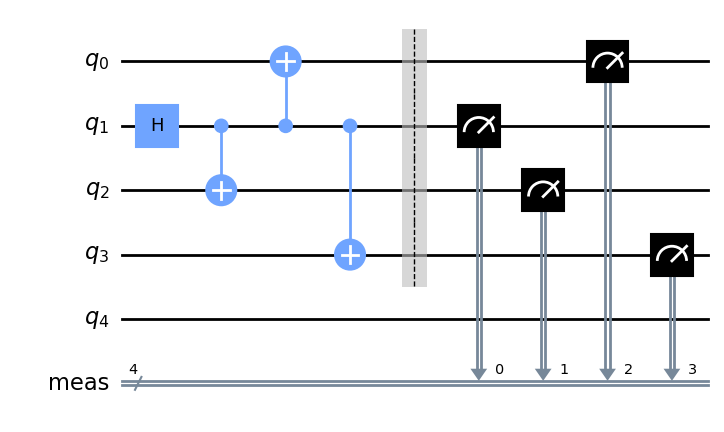

After: <qiskit.transpiler.passes.basis.unroll_custom_definitions.UnrollCustomDefinitions object at 0x7f29f9dfc610>


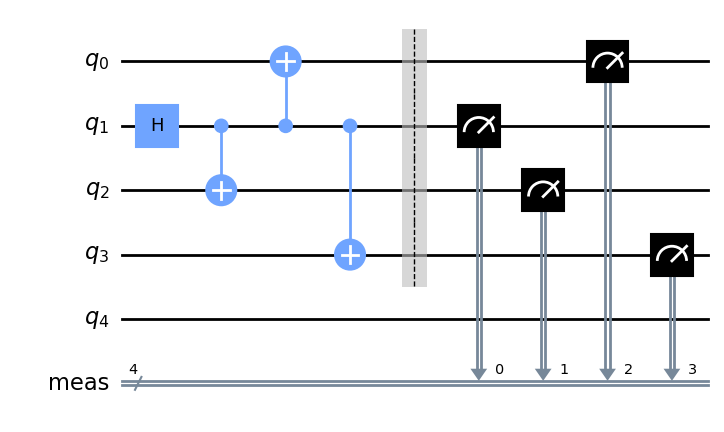

After: <qiskit.transpiler.passes.basis.basis_translator.BasisTranslator object at 0x7f29f9dfc4d0>


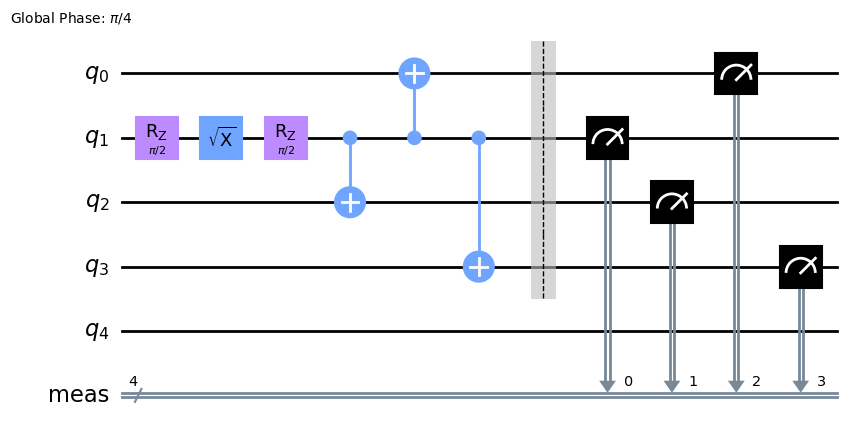

After: <qiskit.transpiler.passes.optimization.remove_reset_in_zero_state.RemoveResetInZeroState object at 0x7f29f9dfca90>


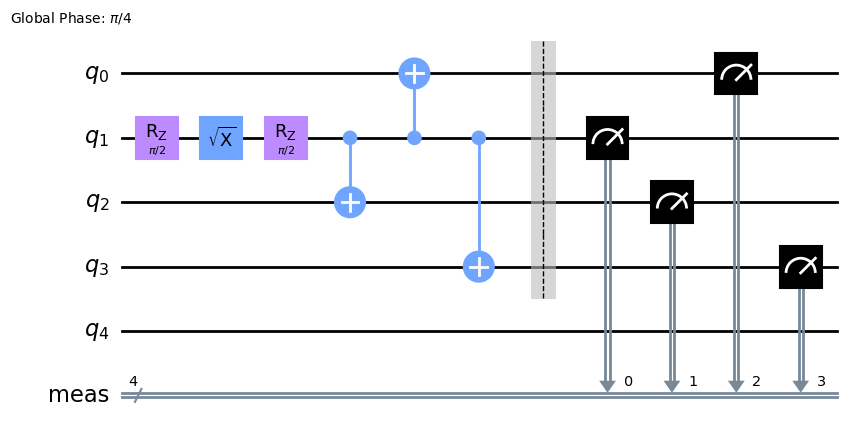

After: <qiskit.transpiler.passes.analysis.depth.Depth object at 0x7f29f9e1d650>


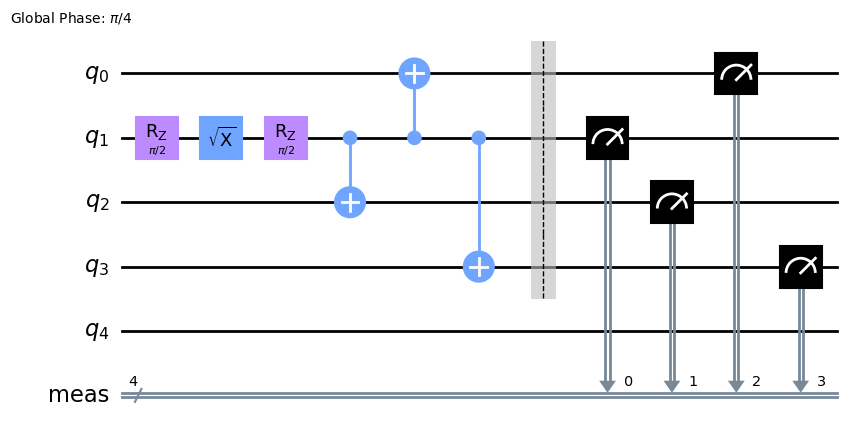

After: <qiskit.transpiler.passes.utils.fixed_point.FixedPoint object at 0x7f29f9de2ad0>


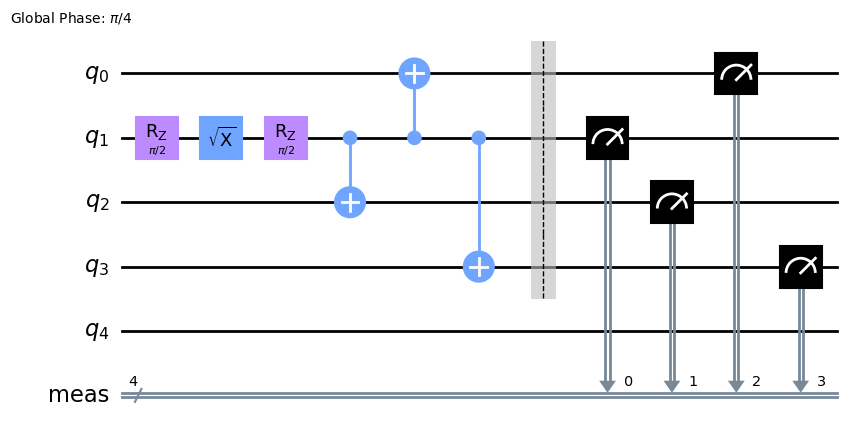

After: <qiskit.transpiler.passes.analysis.size.Size object at 0x7f29f9de2c90>


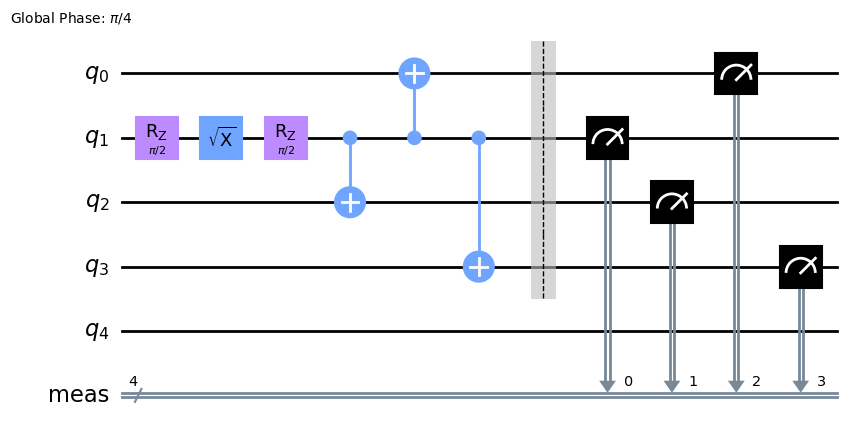

After: <qiskit.transpiler.passes.utils.fixed_point.FixedPoint object at 0x7f29f9de2d50>


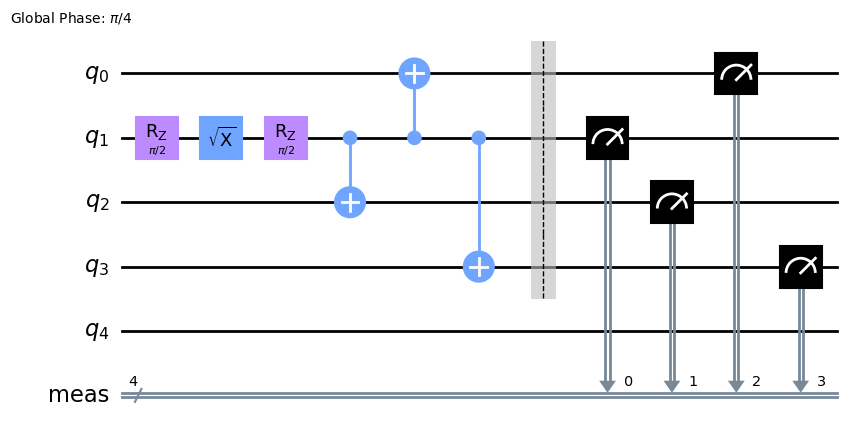

After: <qiskit.transpiler.passes.optimization.collect_2q_blocks.Collect2qBlocks object at 0x7f29f9de2e50>


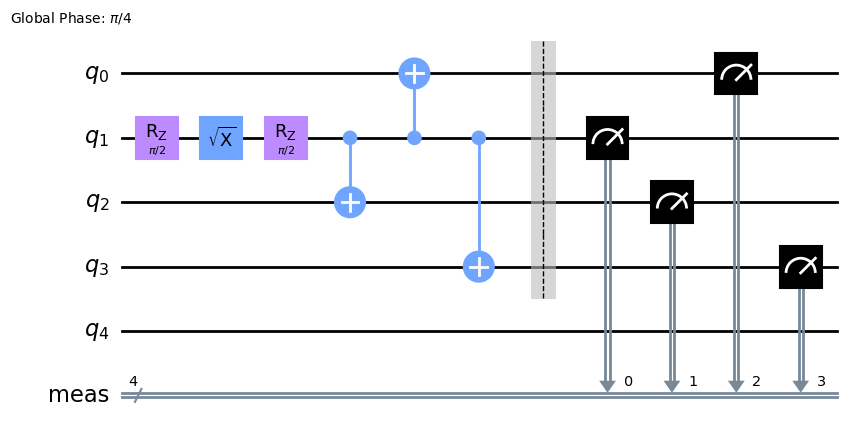

After: <qiskit.transpiler.passes.optimization.consolidate_blocks.ConsolidateBlocks object at 0x7f29f9de2e90>


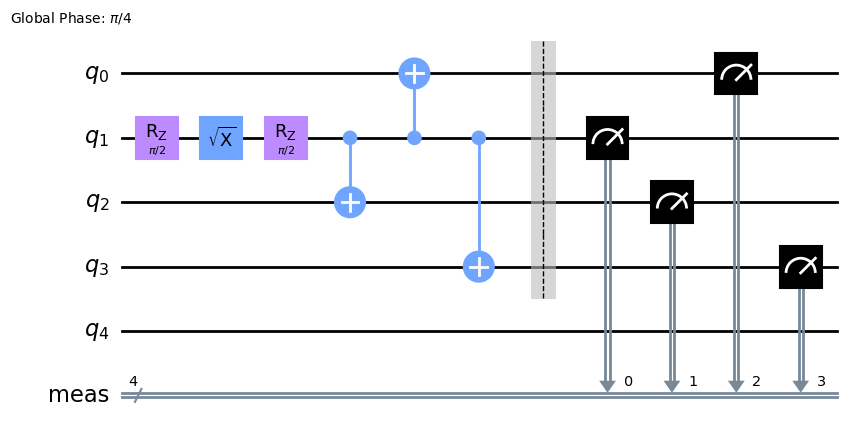

After: <qiskit.transpiler.passes.synthesis.unitary_synthesis.UnitarySynthesis object at 0x7f29fa6316d0>


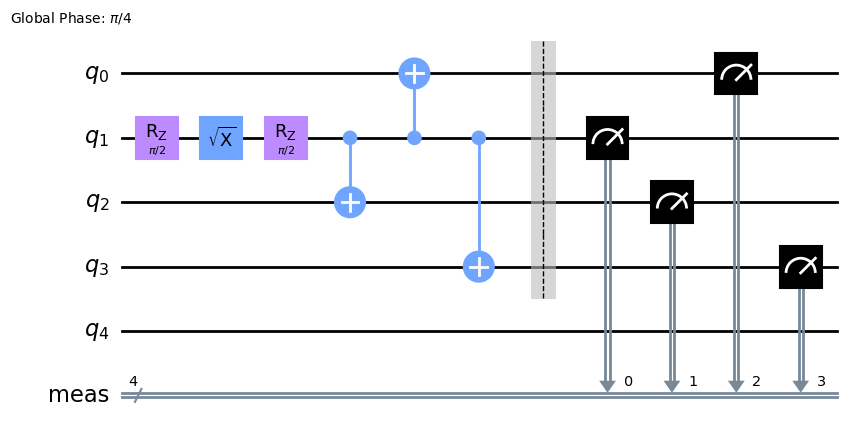

After: <qiskit.transpiler.passes.optimization.optimize_1q_decomposition.Optimize1qGatesDecomposition object at 0x7f2a6a8b01d0>


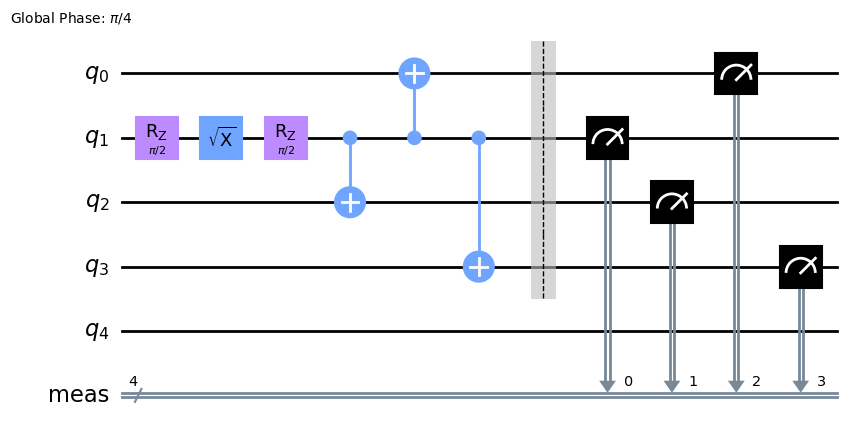

After: <qiskit.transpiler.passes.optimization.commutation_analysis.CommutationAnalysis object at 0x7f29fa78f050>


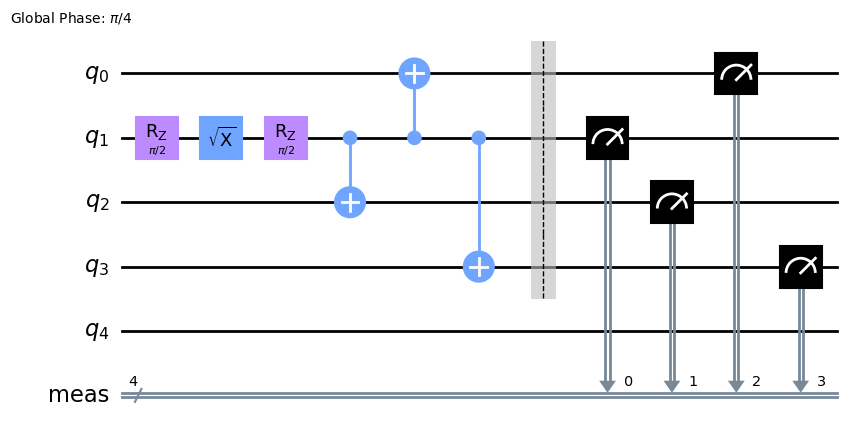

After: <qiskit.transpiler.passes.optimization.commutative_cancellation.CommutativeCancellation object at 0x7f29fa607950>


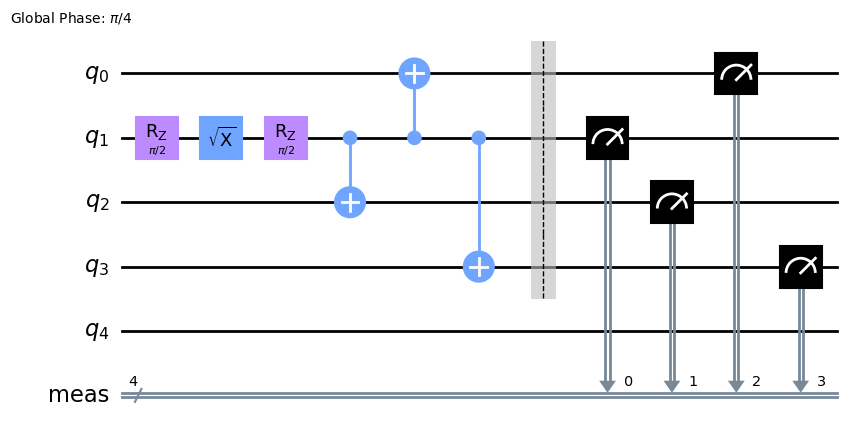

After: <qiskit.transpiler.passes.utils.gates_basis.GatesInBasis object at 0x7f29f9dfc910>


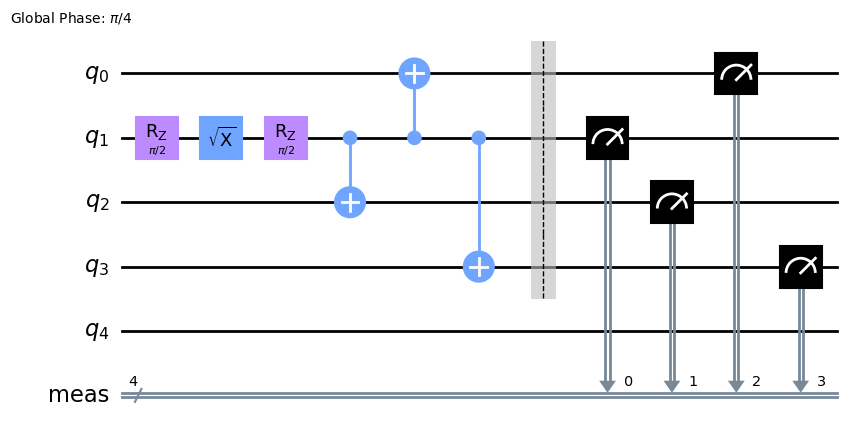

After: <qiskit.transpiler.passes.analysis.depth.Depth object at 0x7f29f9e1d650>


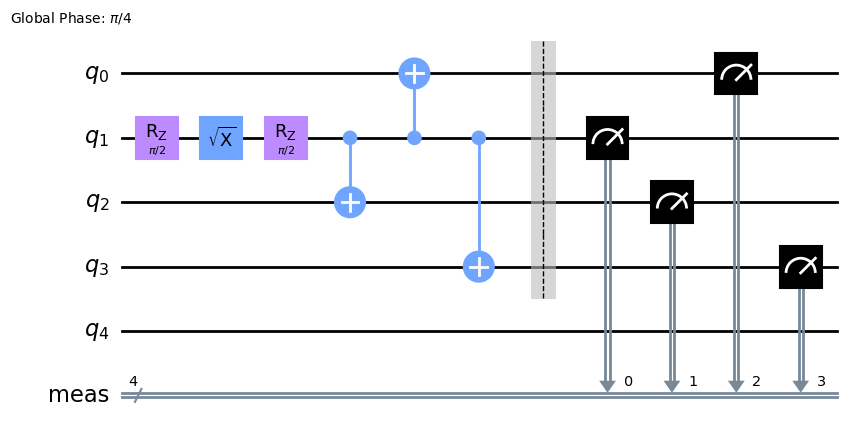

After: <qiskit.transpiler.passes.utils.fixed_point.FixedPoint object at 0x7f29f9de2ad0>


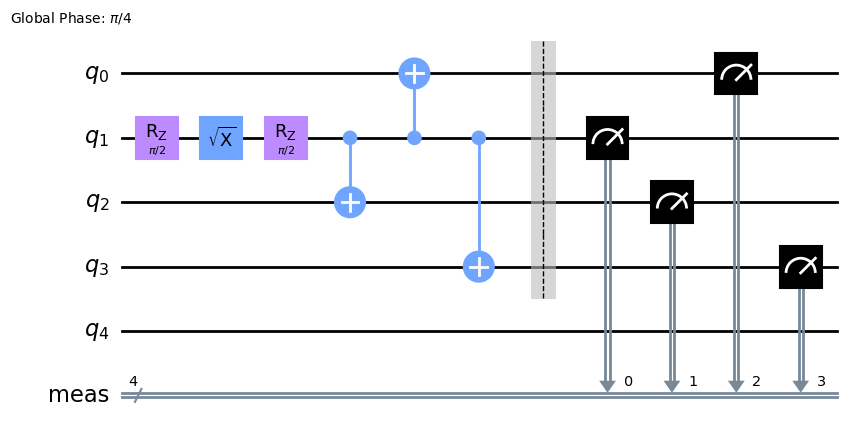

After: <qiskit.transpiler.passes.analysis.size.Size object at 0x7f29f9de2c90>


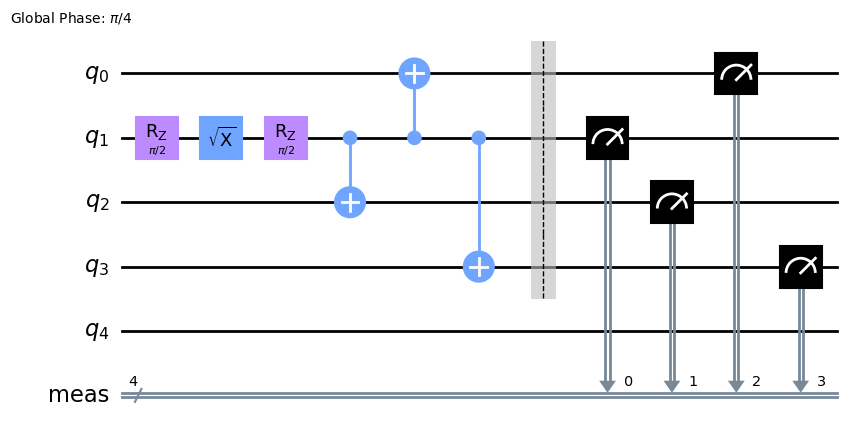

After: <qiskit.transpiler.passes.utils.fixed_point.FixedPoint object at 0x7f29f9de2d50>


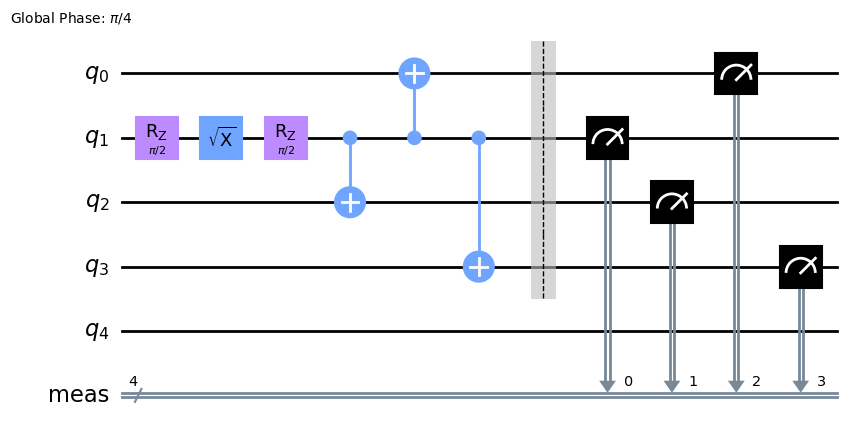

After: <qiskit.transpiler.passes.scheduling.time_unit_conversion.TimeUnitConversion object at 0x7f29b8f03a10>


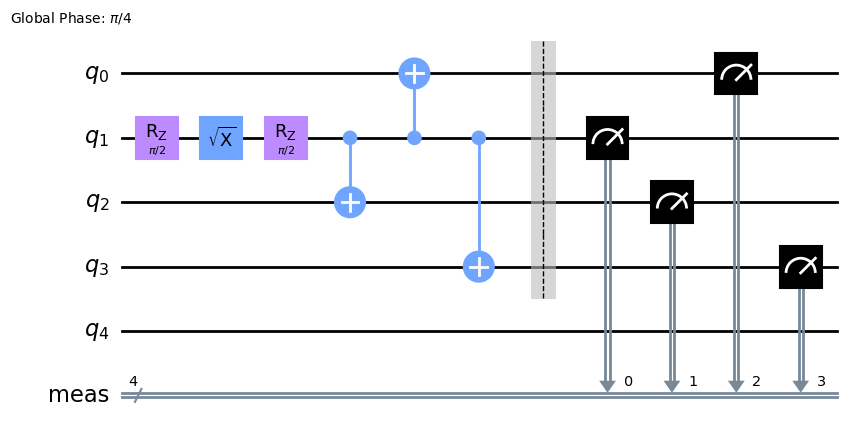

After: <qiskit.transpiler.passes.scheduling.scheduling.alap.ALAPScheduleAnalysis object at 0x7f29b9097f10>


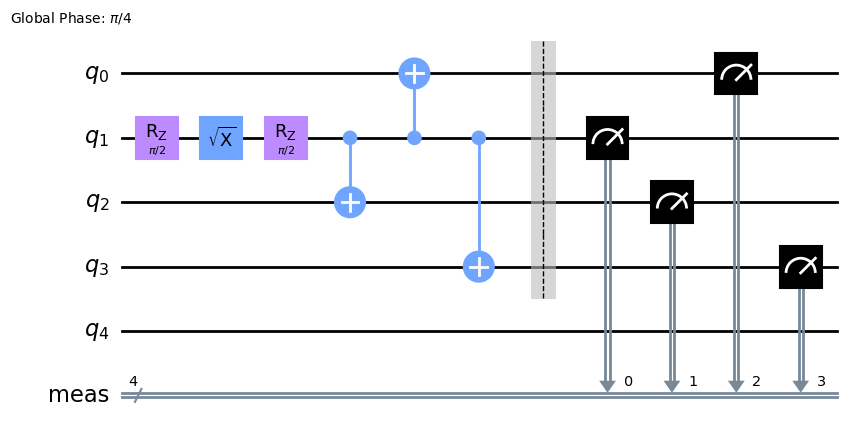

After: <qiskit.transpiler.passes.scheduling.padding.dynamical_decoupling.PadDynamicalDecoupling object at 0x7f2a73ea7810>


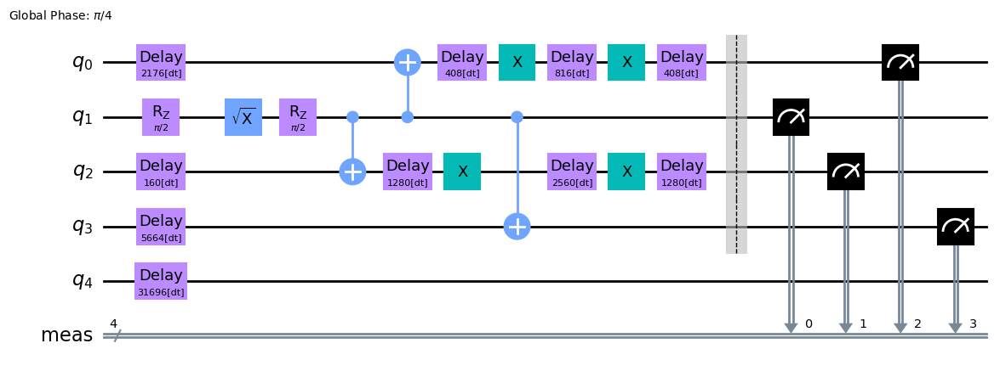

In [14]:
from qiskit.converters import dag_to_circuit
def callback(**kwargs):
    intermediate_circuit = dag_to_circuit(kwargs['dag'])
    intermediate_circuit.name = 'After: ' + str(kwargs['pass_'])
    print(intermediate_circuit.name)
    display(intermediate_circuit.draw('mpl'))

pm.run(circuit, callback=callback)

### Stage Plugins



Building off the `StagedPassManager` is the introduction of external plugins for `transpile()` (and by extension `generate_preset_pass_manager()`. Since the stages are defined points in the execution of a compilation pipeline an external package can now provide alternative implenentations that can be used for these stages. The `*_method` keyword arguments on `transpile()` are used to specify which plugin to use

You can see the details on writing a plugin in the documentation here:

https://qiskit.org/documentation/apidoc/transpiler_plugins.html

In [15]:
# pip install git+https://github.com/qiskit-community/dsm-swap
from qiskit.transpiler.preset_passmanagers import plugin
plugin.list_stage_plugins("routing")

['basic', 'lookahead', 'none', 'sabre', 'stochastic', 'dsm']

In [16]:
# pip install git+https://github.com/mtreinish/vf2_partial_layout
plugin.list_stage_plugins("layout")

['vf2_partial']

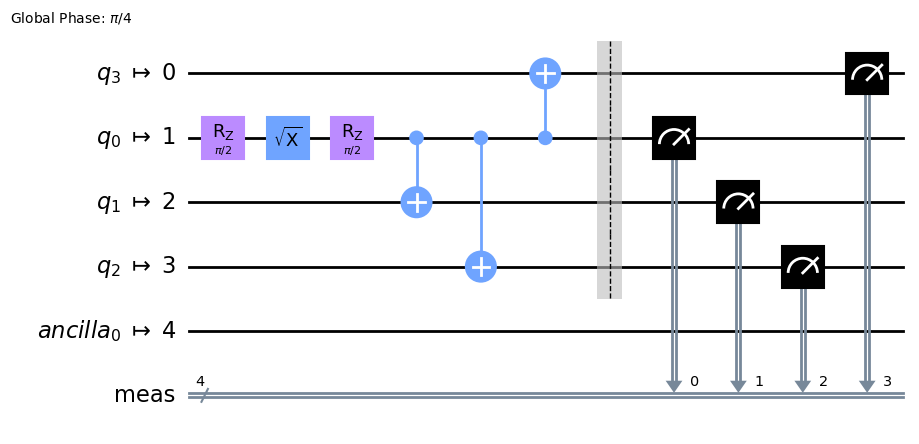

In [17]:
from qiskit import transpile
backend = FakeBelemV2()

transpile(circuit, backend, layout_method='vf2_partial', routing_method="dsm").draw('mpl')

### Synthesis Plugins

The Qiskit compiler has two types of synthesis plugins. An interface for pluggable methods of unitary synthesis and a plugin interface for of higher level constructs like Cliffords, linear functions, etc.

#### Unitary Synthesis Plugins

When a circuit contains a `UnitaryGate` (a gate modeled solely by its unitary matrix) the unitary synthesis plugin interface allows external packages to provide alternative methods for synthesizing that unitary.

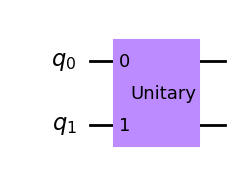

In [18]:
from qiskit.quantum_info import random_unitary

matrix = random_unitary(4)
qc = QuantumCircuit(2)
qc.unitary(matrix, [0, 1])
qc.draw('mpl')

In [19]:
from qiskit.transpiler.passes.synthesis.plugin import unitary_synthesis_plugin_names

unitary_synthesis_plugin_names()

['aqc', 'default']

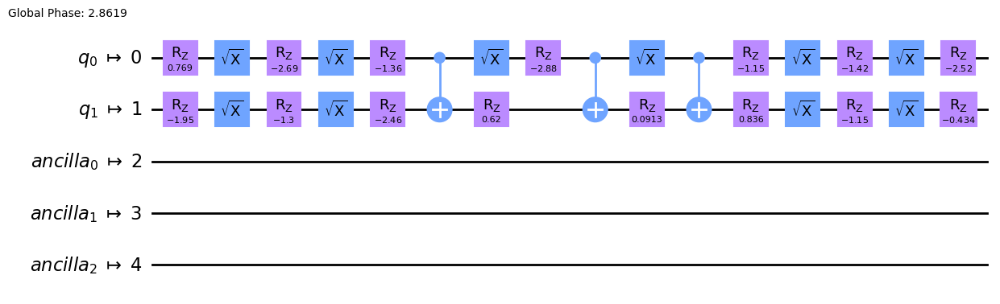

In [20]:
aqc_config = {"networkx_layout": "cart", "connectivity_type": "star"}
transpile(qc, backend, unitary_synthesis_method='aqc', unitary_synthesis_plugin_config=aqc_config).draw('mpl')

### High Level Synthesis Plugins

This new interface lets external packages provide synthesis methods for arbitrary higher level circuit objects.

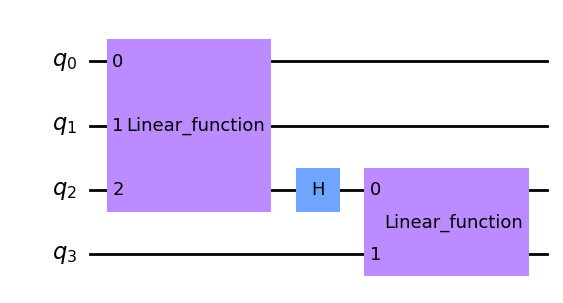

In [21]:
from qiskit.circuit.library import LinearFunction

qc1 = QuantumCircuit(3)
qc1.swap(0, 2)
qc1.cx(0, 1)
qc1.swap(1, 2)
lf1 = LinearFunction(qc1)
qc2 = QuantumCircuit(2)
qc2.swap(0, 1)
qc2.cx(1, 0)
qc2.swap(0, 1)
lf2 = LinearFunction(qc2)

qc = QuantumCircuit(4)
qc.append(lf1, [0, 1, 2])
qc.h(2)
qc.append(lf2, [2, 3])
qc.draw("mpl")

Running KutinSynthesisPlugin
Running KutinSynthesisPlugin


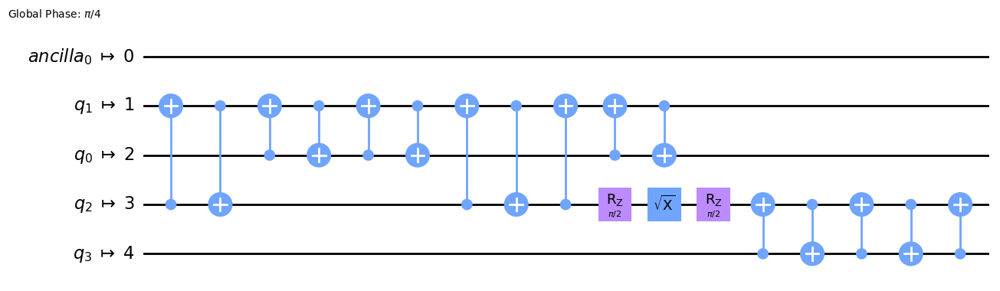

In [22]:
# pip install kutin-synthesis-plugin-for-qiskit
from qiskit.transpiler.passes.synthesis.high_level_synthesis import HLSConfig

hls_config = HLSConfig(linear_function=[("kutin", {})])
transpile(qc, backend, hls_config=hls_config).draw("mpl")

## Improved Backend Representation

In the past year a new version of the backend interface was introduced.
The backend interface defines the interface between Qiskit and a QPU, it serves two purposes to both handle program submission and also to represent the hardware's capabilities and constraints to Qiskit's compiler.

### `BackendV2`

In the `BackendV2` interface the access patterns for interacting with a backend are simplified with flat access and also leveraging Qiskit native objects to represent the capabilities for the backend. For a migration guide between using the old version of the backend interface and the new version see: https://qiskit.org/documentation/apidoc/providers.html#backendv1-backendv2

The `run()` interface remains unchanged between version 1 and version 2.

In [23]:
from qiskit.providers.fake_provider import FakeAuckland
backend = FakeAuckland()
print(f"BackendV{backend.version}")
print(f"Backend Name: {backend.name}")
print(f"Number of qubits: {backend.num_qubits}")
print(f"Supported Operations: {backend.operation_names}")

BackendV2
Backend Name: fake_auckland
Number of qubits: 27
Supported Operations: ['id', 'rz', 'sx', 'x', 'cx', 'reset', 'measure', 'delay']


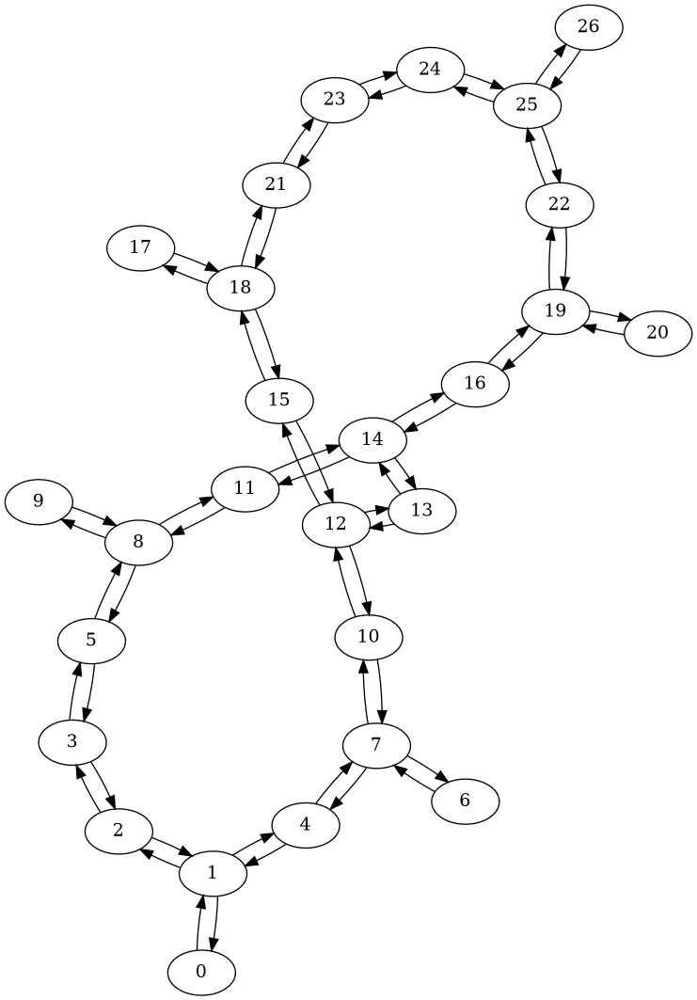

In [24]:
backend.coupling_map.draw()

In [25]:
backend.qubit_properties(0)

QubitProperties(t1=0.00018560879452101232, t2=0.0002033873865310345, frequency=4932969834.248503)

### `Target`

To both enrich the capabilities and simplify the access patterns for representing a target QPU to the Qiskit compiler. The target object lets us represent more constraints about hardware for the compiler. This includes >2 qubit connectivity constraints, hetereogenous gate sets (different gates available on subsets of the device), multiple tuned variants of a gate, etc.

In [26]:
print(backend.target)

Target
Number of qubits: 27
Instructions:
	id
		(0,):
			Duration: 3.5555555555555554e-08 sec.
			Error Rate: 0.00021880026328880683
			With pulse schedule calibration
		(1,):
			Duration: 3.5555555555555554e-08 sec.
			Error Rate: 0.0002000019740945689
			With pulse schedule calibration
		(2,):
			Duration: 3.5555555555555554e-08 sec.
			Error Rate: 0.0001872656221529755
			With pulse schedule calibration
		(3,):
			Duration: 3.5555555555555554e-08 sec.
			Error Rate: 0.00020341034690029013
			With pulse schedule calibration
		(4,):
			Duration: 3.5555555555555554e-08 sec.
			Error Rate: 0.00021170230294224058
			With pulse schedule calibration
		(5,):
			Duration: 3.5555555555555554e-08 sec.
			Error Rate: 0.00016948213969905196
			With pulse schedule calibration
		(6,):
			Duration: 3.5555555555555554e-08 sec.
			Error Rate: 0.0002812176067168515
			With pulse schedule calibration
		(7,):
			Duration: 3.5555555555555554e-08 sec.
			Error Rate: 0.0002855185577915047
			With pulse sch

In [27]:
from qiskit.circuit import Parameter, Measure
from qiskit.transpiler import Target, InstructionProperties
from qiskit.circuit.library import UGate, RZGate, RXGate, RYGate, CXGate, CZGate

target = Target(num_qubits=3)
target.add_instruction(CXGate(), {(0, 1): InstructionProperties(error=.0001, duration=5e-7)})
target.add_instruction(UGate(Parameter('theta'), Parameter('phi'), Parameter('lam')), {(0,): InstructionProperties(error=.00001, duration=5e-8), (1,): InstructionProperties(error=.00002, duration=6e-8)})
target.add_instruction(RZGate(Parameter('theta')), {(1,): InstructionProperties(error=.00001, duration=5e-8), (2,): InstructionProperties(error=.00002, duration=6e-8)})
target.add_instruction(RYGate(Parameter('theta')), {(1,): InstructionProperties(error=.00001, duration=5e-8), (2,): InstructionProperties(error=.00002, duration=6e-8)})
target.add_instruction(RXGate(Parameter('theta')), {(1,): InstructionProperties(error=.00001, duration=5e-8), (2,): InstructionProperties(error=.00002, duration=6e-8)})
target.add_instruction(CZGate(), {(1, 2): InstructionProperties(error=.0001, duration=5e-7), (2, 0): InstructionProperties(error=.0001, duration=5e-7)})
target.add_instruction(Measure(), {(0,): InstructionProperties(error=.001, duration=5e-5), (1,): InstructionProperties(error=.002, duration=6e-5), (2,): InstructionProperties(error=.2, duration=5e-7)})

print(target)

Target
Number of qubits: 3
Instructions:
	cx
		(0, 1):
			Duration: 5e-07 sec.
			Error Rate: 0.0001
	u
		(0,):
			Duration: 5e-08 sec.
			Error Rate: 1e-05
		(1,):
			Duration: 6e-08 sec.
			Error Rate: 2e-05
	rz
		(1,):
			Duration: 5e-08 sec.
			Error Rate: 1e-05
		(2,):
			Duration: 6e-08 sec.
			Error Rate: 2e-05
	ry
		(1,):
			Duration: 5e-08 sec.
			Error Rate: 1e-05
		(2,):
			Duration: 6e-08 sec.
			Error Rate: 2e-05
	rx
		(1,):
			Duration: 5e-08 sec.
			Error Rate: 1e-05
		(2,):
			Duration: 6e-08 sec.
			Error Rate: 2e-05
	cz
		(1, 2):
			Duration: 5e-07 sec.
			Error Rate: 0.0001
		(2, 0):
			Duration: 5e-07 sec.
			Error Rate: 0.0001
	measure
		(0,):
			Duration: 5e-05 sec.
			Error Rate: 0.001
		(1,):
			Duration: 6e-05 sec.
			Error Rate: 0.002
		(2,):
			Duration: 5e-07 sec.
			Error Rate: 0.2



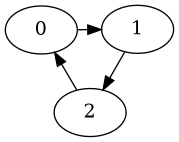

In [28]:
target.build_coupling_map().draw()

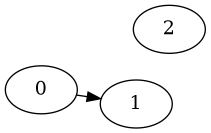

In [29]:
target.build_coupling_map('cx').draw()

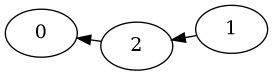

In [30]:
target.build_coupling_map('cz').draw()

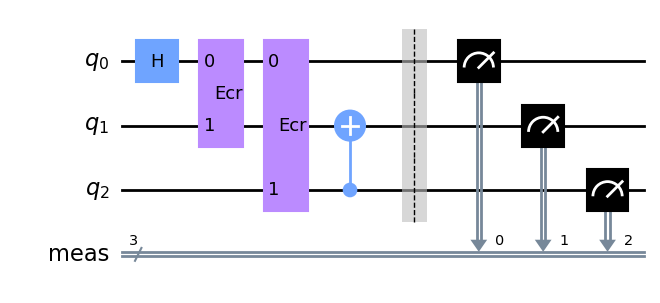

In [31]:
qc = QuantumCircuit(3)
qc.h(0)
qc.ecr(0, 1)
qc.ecr(0, 2)
qc.cx(2, 1)
qc.measure_all()
qc.draw('mpl')

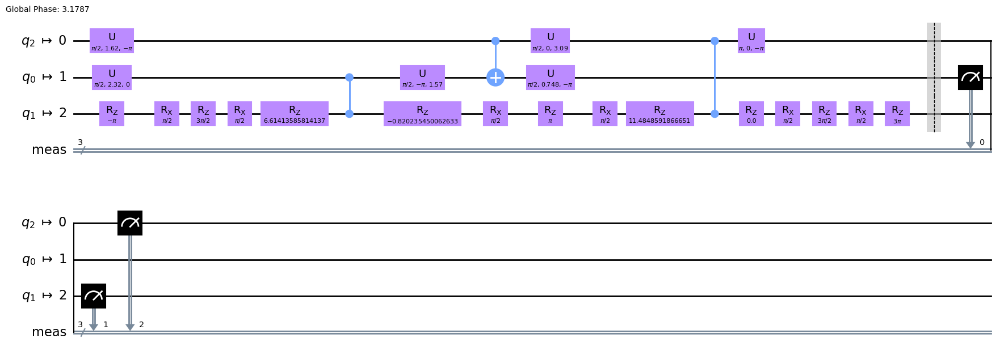

In [32]:
transpile(qc, target=target, optimization_level=3).draw('mpl')

### Backend Default Plugins

If a backend has custom compilation requirements that adressable with the current Qiskit transpiler backends can specify alternate default compilation methods when they're targeted.

In [33]:
def plugin_fn(*args):
    return "alap"

backend.get_scheduling_stage_plugin = plugin_fn
res = transpile(qc, backend)

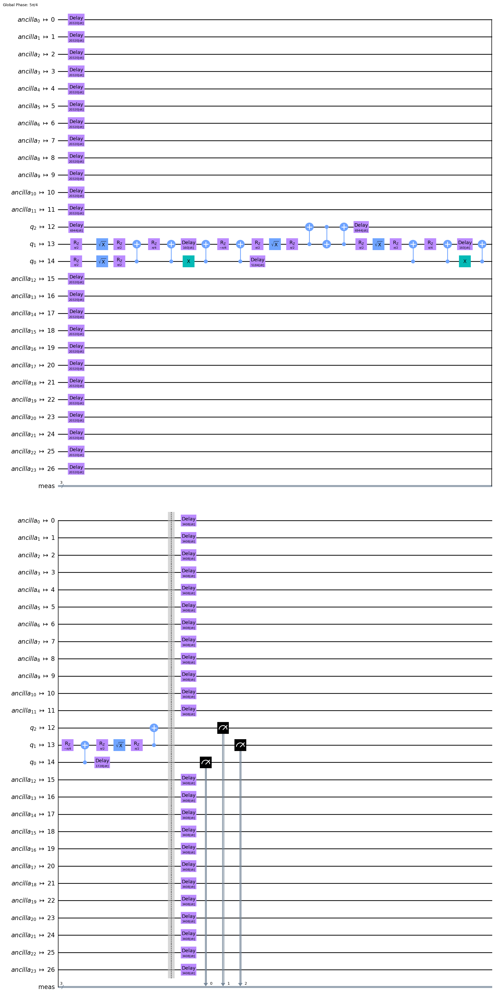

In [34]:
res.draw("mpl")

## Transpiler Performance Improvements

Over the last year the transpiler's performance has greatly improved, especially for larger numbers of Qubits. This was primarily facilitated by moving performance critical portions of the compiler to Rust. By using a compiled language, an also the advantages of the Rust language to efficiently reimplement algorithms to be multithreaded we're able to achieve large speed-ups and also improve the quality of the output.


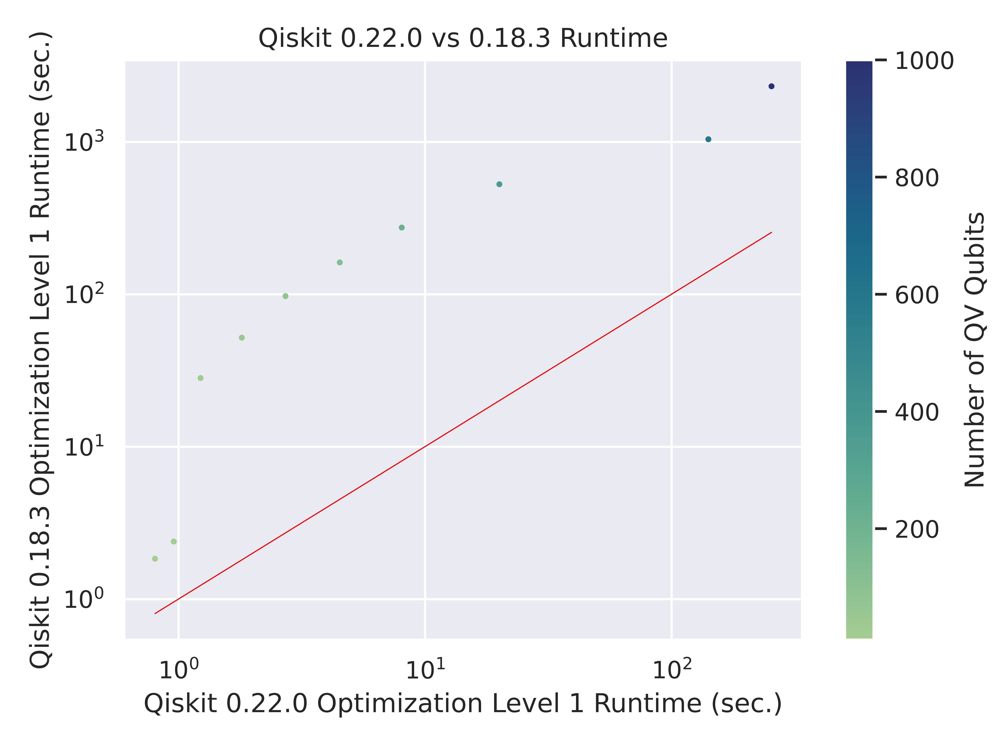

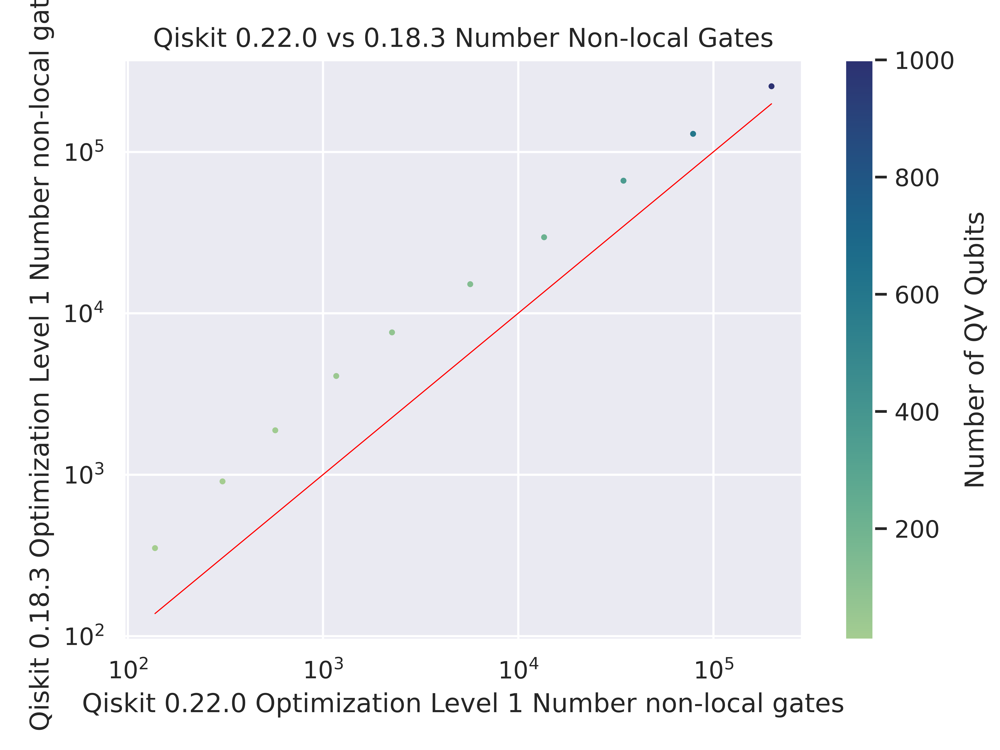

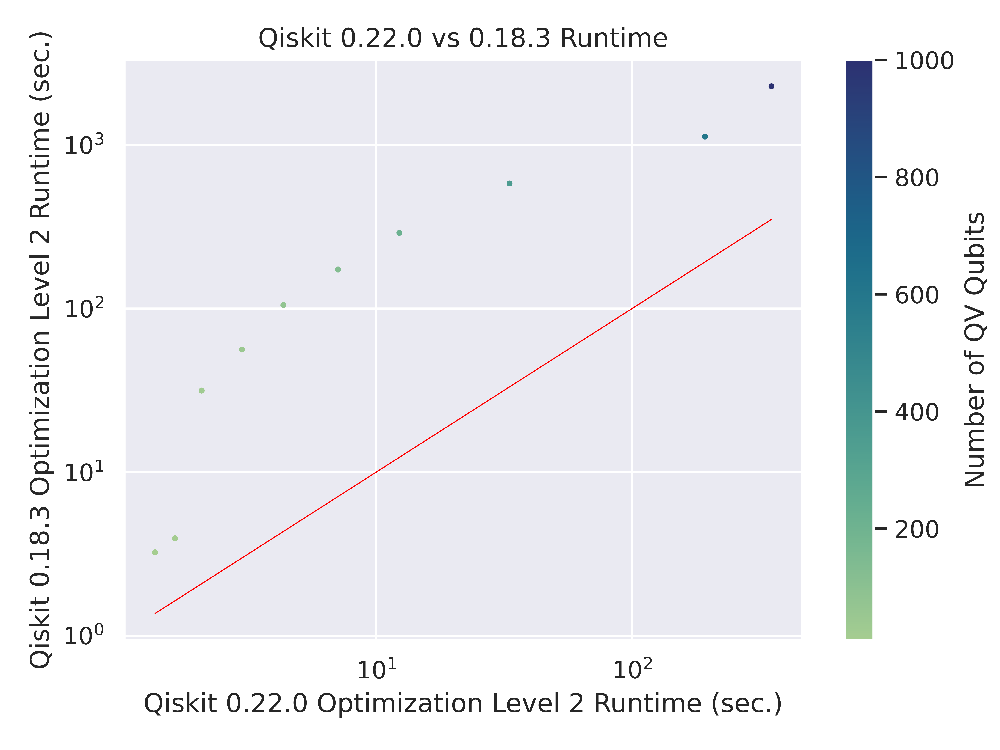

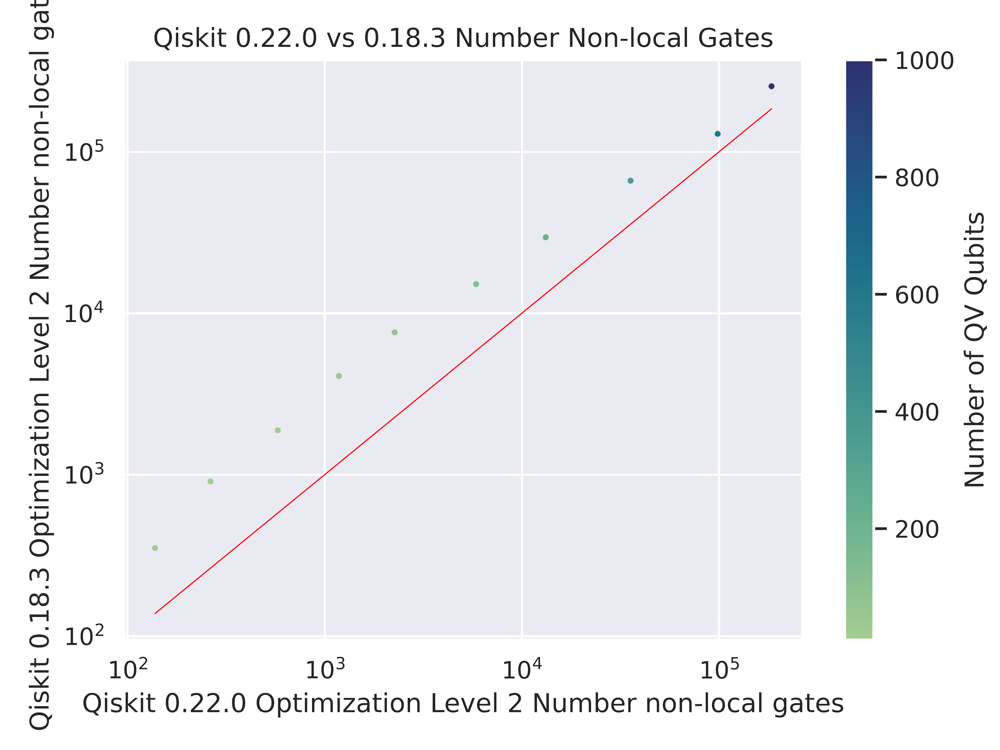

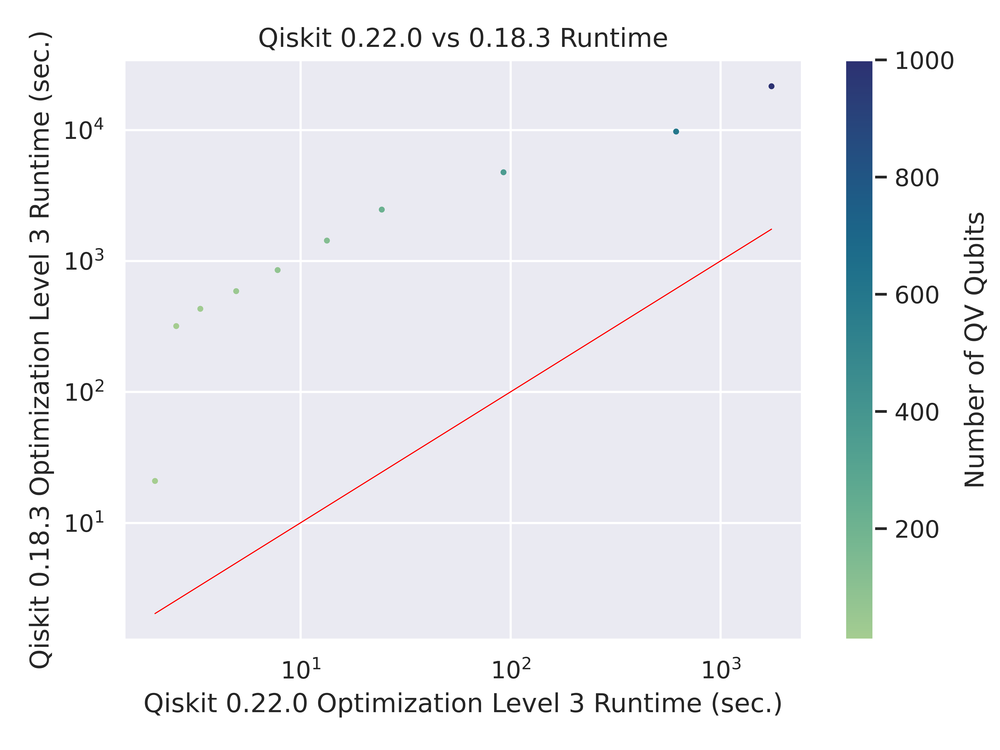

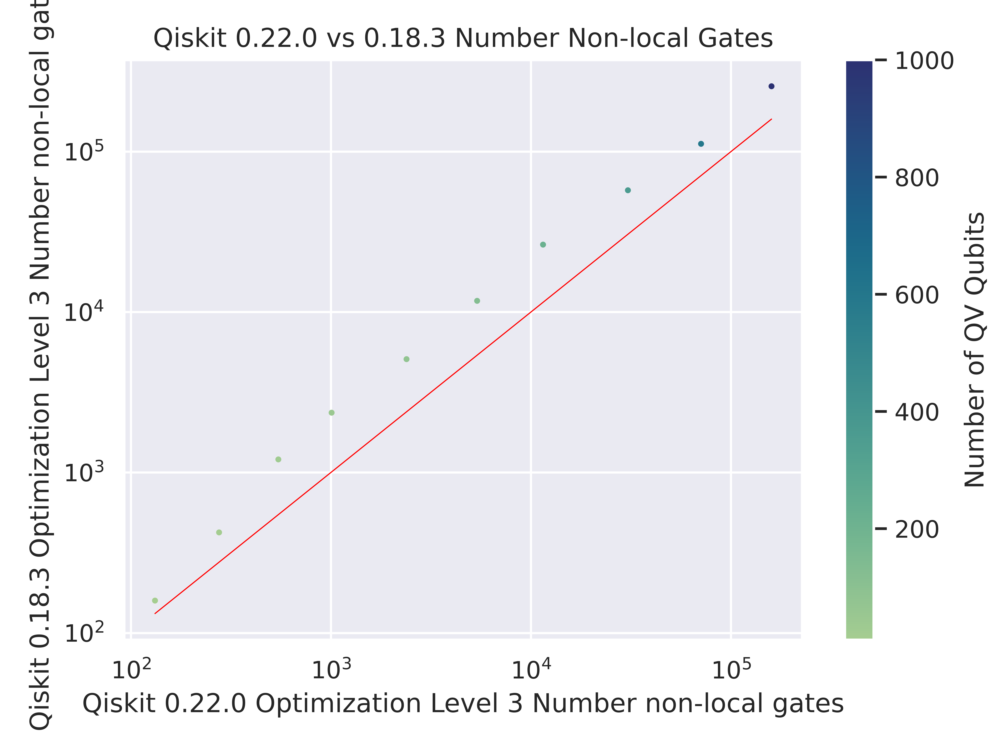

Create a fake 1081 qubit heavy hex topology target:

In [35]:
from qiskit.circuit.library import CXGate, XGate, SXGate, RZGate
from qiskit.circuit import Parameter, Measure
import rustworkx as rx
import numpy as np

rng = np.random.default_rng(seed=42)

target = Target()
# Add RZ gate:
target.add_instruction(
    RZGate(Parameter("theta")),
    {(x,): InstructionProperties(error=0, duration=0) for x in range(1081)},
)
# Add X Gate:
target.add_instruction(
    XGate(),
    {
        (x,): InstructionProperties(
            error=rng.uniform(1e-9, 1e-6), duration=rng.uniform(1e-9, 9e-9)
        )
        for x in range(1081)
    },
)
# Add SX Gate:
target.add_instruction(
    SXGate(),
    {
        (x,): InstructionProperties(
            error=rng.uniform(1e-9, 1e-6), duration=rng.uniform(1e-9, 9e-9)
        )
        for x in range(1081)
    },
)
# Add Measure
target.add_instruction(
    Measure(),
    {
        (x,): InstructionProperties(
            error=rng.uniform(1e-9, 1e-6), duration=rng.uniform(1e-9, 9e-9)
        )
        for x in range(1081)
    },
)
# Add CNOT Gate:
target.add_instruction(
    CXGate(),
    {
        edge: InstructionProperties(
            error=rng.uniform(1e-9, 1e-6), duration=rng.uniform(1e-9, 9e-9)
        )
        for edge in rx.generators.directed_heavy_hex_graph(21).edge_list()
    },
)

In [36]:
target.build_coupling_map().draw()

In [37]:
print(target.build_coupling_map().graph.num_nodes())

1081


In [38]:
from qiskit import transpile
from qiskit.circuit import QuantumCircuit

ghz = QuantumCircuit(1081)
ghz.h(0)
for i in range(1, 1081):
    ghz.cz(0, i)
ghz.measure_all()

In [39]:
%timeit transpile(ghz, target=target, optimization_level=1, seed_transpiler=42)

8.9 s ± 66 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)


## Quality Improvements

In addition to the runtime performance improvements in the Qiskit compiler the past year has seen improvements in the output quality of the compiler.

### VF2 Family of  compiler passes

Leveraging the [rustworkx](https://qiskit.org/documentation/rustworkx/) 
library's VF2 subgraph isomorphism algorithm new passes for searching for ideal layouts were added. The first pass `VF2Layout` searches for a
perfect layout (one where no additional SWAPs are required) by modeling layout as a subgraph isomorphism problem, and then selecting the lowest noise subgraph if a solution is found. The second pass `VF2PostLayout` applies the same basic algorithm as `VF2Layout` but runs after routing and is used to find a lower noise layout (see: [arXiv:2209.15512](https://arxiv.org/abs/2209.15512) for more details).

In [40]:
from qiskit.transpiler.passes import VF2Layout, VF2PostLayout

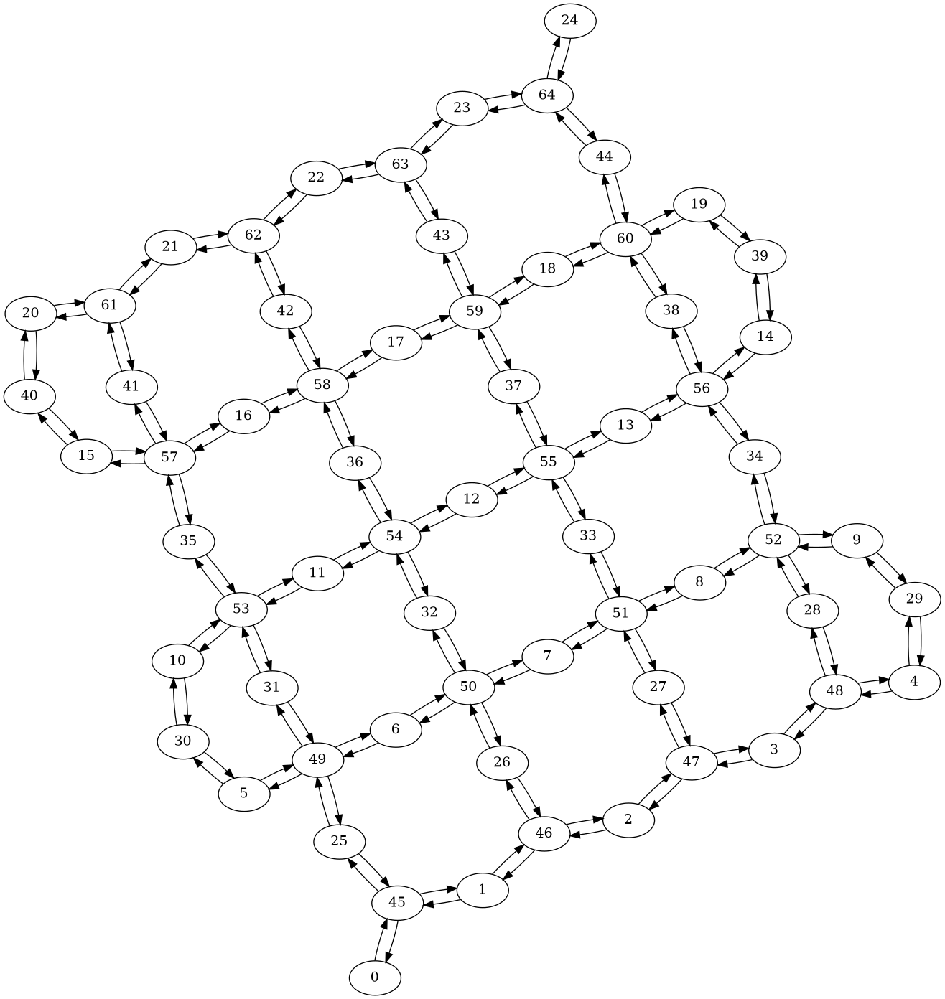

In [41]:
coupling_map = CouplingMap.from_heavy_square(5)
coupling_map.draw()

In [42]:
target = Target()
target.add_instruction(
    XGate(),
    {
        (qubit,): InstructionProperties(
            error=rng.uniform(1e-9, 1e-6), duration=rng.uniform(1e-9, 9e-9)
        )
        for qubit in coupling_map.physical_qubits
    },
)
target.add_instruction(
    CXGate(),
    {
        edge: InstructionProperties(
            error=rng.uniform(1e-9, 1e-6), duration=rng.uniform(1e-9, 9e-9)
        )
        for edge in coupling_map.get_edges()
    },
)

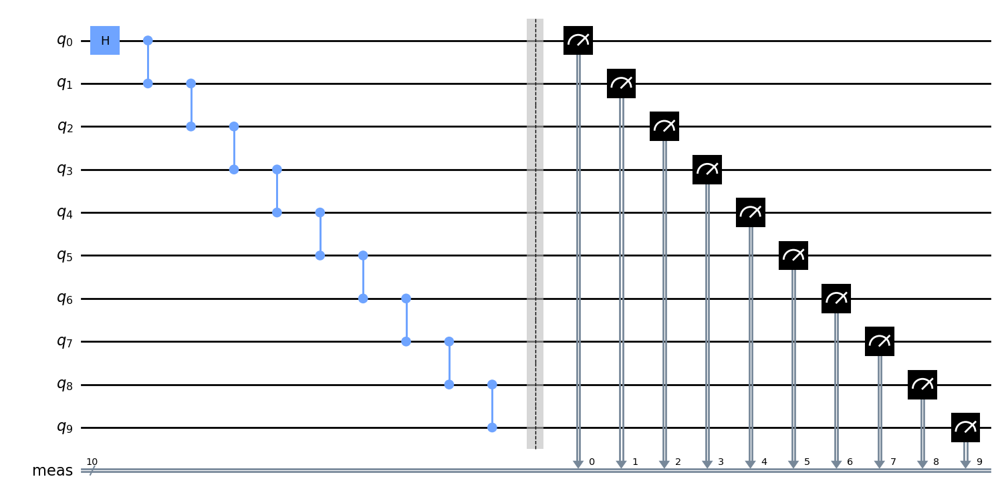

In [43]:
linear_circuit = QuantumCircuit(10)
linear_circuit.h(0)
for i in range(9):
    linear_circuit.cz(i, i+1)
linear_circuit.measure_all()
linear_circuit.draw('mpl')

In [44]:
layout_pass = VF2Layout(target=target)
layout_pass(linear_circuit)
layout = layout_pass.property_set["layout"]
print(layout)

Layout({
52: Qubit(QuantumRegister(10, 'q'), 1),
8: Qubit(QuantumRegister(10, 'q'), 2),
9: Qubit(QuantumRegister(10, 'q'), 0),
51: Qubit(QuantumRegister(10, 'q'), 3),
7: Qubit(QuantumRegister(10, 'q'), 4),
50: Qubit(QuantumRegister(10, 'q'), 5),
6: Qubit(QuantumRegister(10, 'q'), 6),
49: Qubit(QuantumRegister(10, 'q'), 7),
5: Qubit(QuantumRegister(10, 'q'), 8),
30: Qubit(QuantumRegister(10, 'q'), 9)
})


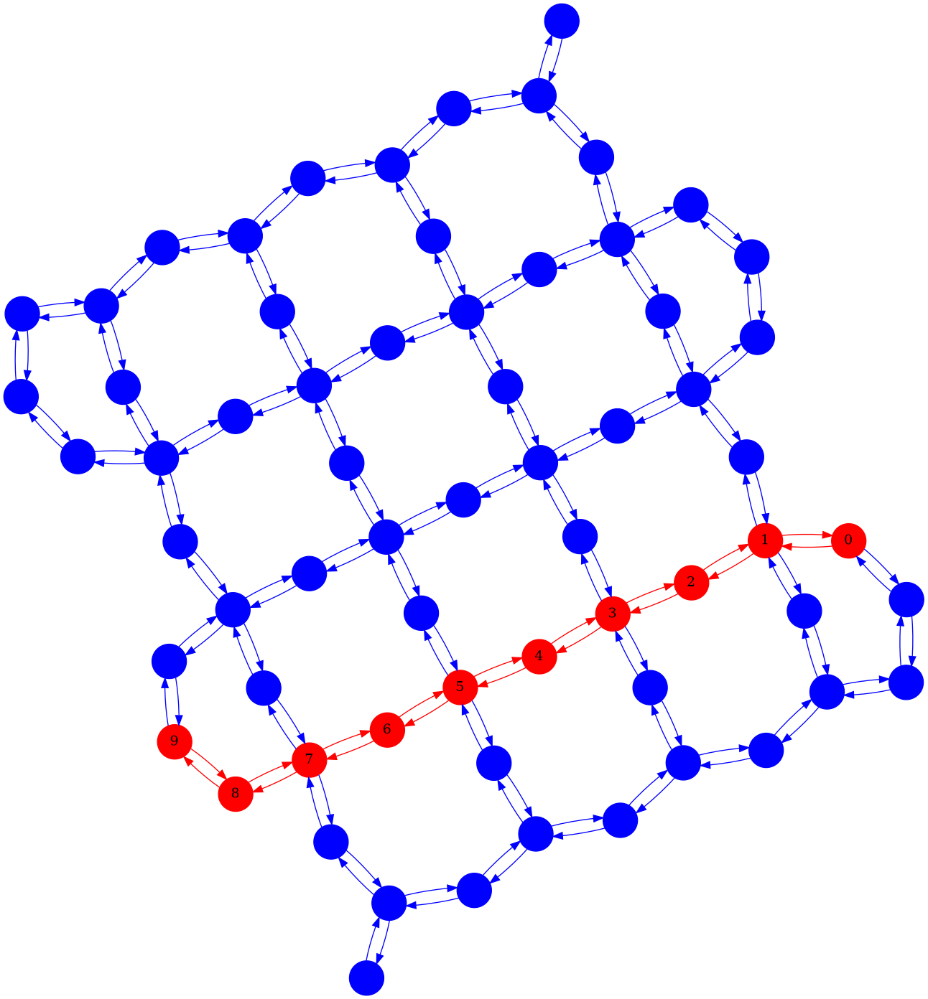

In [45]:
from rustworkx.visualization import graphviz_draw

graph = target.build_coupling_map().graph
for node in graph.node_indices():
    graph[node] = node
    
for edge, triple in graph.edge_index_map().items():
    graph.update_edge_by_index(edge, (triple[0], triple[1]))

physical_bits = layout.get_physical_bits()
qubit_indices = {bit: index for index, bit in enumerate(linear_circuit.qubits)}
    
def color_node(node):
    if node in physical_bits:
        out_dict = {
            "label": str(qubit_indices[physical_bits[node]]),
            "color": "red",
            "fillcolor": "red",
            "style": "filled",
            "shape": "circle",
        }
    else:
        out_dict = {
            "label": "",
            "color": "blue",
            "fillcolor": "blue",
            "style": "filled",
            "shape": "circle",
        }
    return out_dict

def color_edge(edge):
    if all(x in physical_bits for x in edge):
        out_dict = {
            "color": "red",
            "fillcolor": "red",
        }
    else:
        out_dict = {
            "color": "blue",
            "fillcolor": "blue",
        }
    return out_dict
        
graphviz_draw(graph, method="neato", node_attr_fn=color_node, edge_attr_fn=color_edge)

In [46]:
# transpile circuit with fixed layout method to skip VF2PostLayout
from qiskit.circuit.library import QFT
qc = QFT(5)
qc.measure_all()
backend = FakeAuckland()
res = transpile(qc, backend, layout_method='sabre', routing_method='sabre')

In [47]:
print(res._layout.initial_layout)

Layout({
2: Qubit(QuantumRegister(5, 'q'), 0),
3: Qubit(QuantumRegister(5, 'q'), 1),
5: Qubit(QuantumRegister(5, 'q'), 2),
8: Qubit(QuantumRegister(5, 'q'), 3),
9: Qubit(QuantumRegister(5, 'q'), 4),
0: Qubit(QuantumRegister(22, 'ancilla'), 0),
1: Qubit(QuantumRegister(22, 'ancilla'), 1),
4: Qubit(QuantumRegister(22, 'ancilla'), 2),
6: Qubit(QuantumRegister(22, 'ancilla'), 3),
7: Qubit(QuantumRegister(22, 'ancilla'), 4),
10: Qubit(QuantumRegister(22, 'ancilla'), 5),
11: Qubit(QuantumRegister(22, 'ancilla'), 6),
12: Qubit(QuantumRegister(22, 'ancilla'), 7),
13: Qubit(QuantumRegister(22, 'ancilla'), 8),
14: Qubit(QuantumRegister(22, 'ancilla'), 9),
15: Qubit(QuantumRegister(22, 'ancilla'), 10),
16: Qubit(QuantumRegister(22, 'ancilla'), 11),
17: Qubit(QuantumRegister(22, 'ancilla'), 12),
18: Qubit(QuantumRegister(22, 'ancilla'), 13),
19: Qubit(QuantumRegister(22, 'ancilla'), 14),
20: Qubit(QuantumRegister(22, 'ancilla'), 15),
21: Qubit(QuantumRegister(22, 'ancilla'), 16),
22: Qubit(Quantum

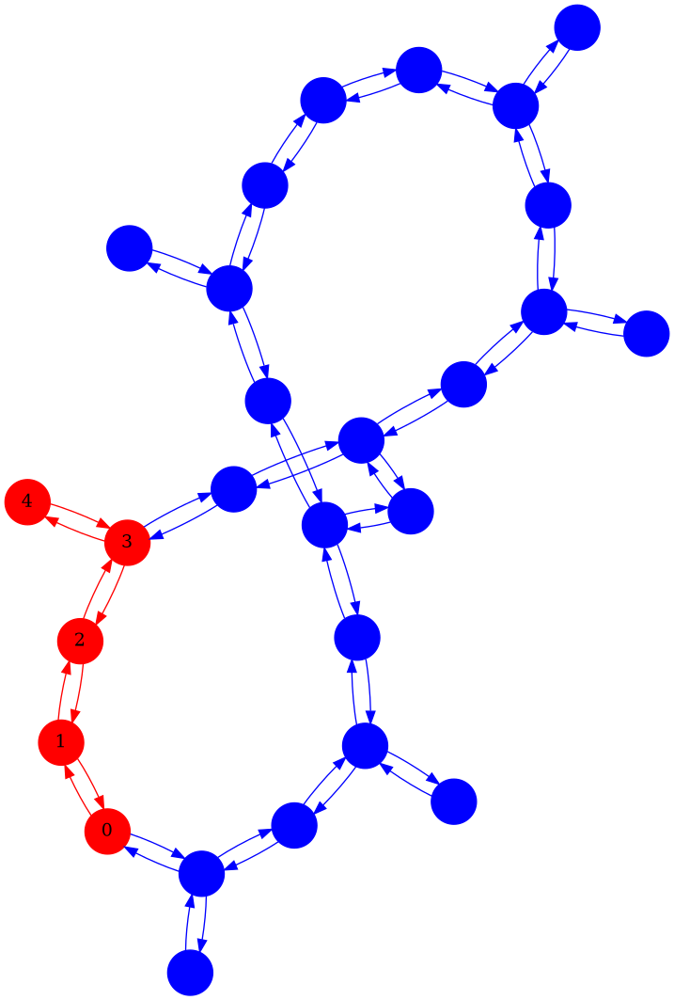

In [48]:
graph = backend.target.build_coupling_map().graph
for node in graph.node_indices():
    graph[node] = node
    
for edge, triple in graph.edge_index_map().items():
    graph.update_edge_by_index(edge, (triple[0], triple[1]))

physical_bits = res._layout.initial_layout
qubit_indices = {bit: index for index, bit in enumerate(qc.qubits)}
    
def color_node(node):
    if physical_bits[node] in qubit_indices:
        out_dict = {
            "label": str(qubit_indices[physical_bits[node]]),
            "color": "red",
            "fillcolor": "red",
            "style": "filled",
            "shape": "circle",
        }
    else:
        out_dict = {
            "label": "",
            "color": "blue",
            "fillcolor": "blue",
            "style": "filled",
            "shape": "circle",
        }
    return out_dict

def color_edge(edge):
    if all(physical_bits[x] in qubit_indices for x in edge):
        out_dict = {
            "color": "red",
            "fillcolor": "red",
        }
    else:
        out_dict = {
            "color": "blue",
            "fillcolor": "blue",
        }
    return out_dict
graphviz_draw(graph, method="neato", node_attr_fn=color_node, edge_attr_fn=color_edge)

In [49]:
post_layout_pass = VF2PostLayout(target=backend.target)
post_layout_pass(res)
post_layout = post_layout_pass.property_set["post_layout"]
print(post_layout)

Layout({
2: Qubit(QuantumRegister(27, 'q'), 8),
3: Qubit(QuantumRegister(27, 'q'), 5),
1: Qubit(QuantumRegister(27, 'q'), 9),
5: Qubit(QuantumRegister(27, 'q'), 3),
8: Qubit(QuantumRegister(27, 'q'), 2)
})


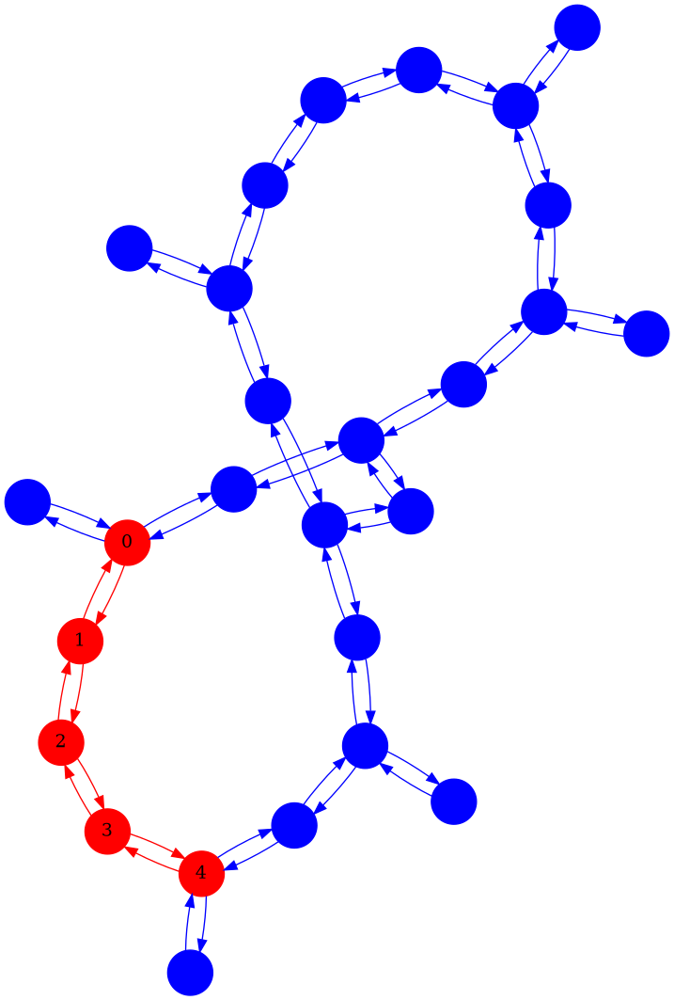

In [50]:
graph = backend.target.build_coupling_map().graph
for node in graph.node_indices():
    graph[node] = node
    
for edge, triple in graph.edge_index_map().items():
    graph.update_edge_by_index(edge, (triple[0], triple[1]))


layout = res._layout.initial_layout
physical_bits = post_layout
qubit_indices = {bit: index for index, bit in enumerate(res.qubits)}
input_qubit_indices = {bit: index for index, bit in enumerate(qc.qubits)}
original_qubits = {res.qubits[index]: layout[index] for bit, index in qubit_indices.items()}
    
def color_node(node):
    if node in physical_bits:
        out_dict = {
            "label": str(input_qubit_indices[original_qubits[physical_bits[node]]]),
            "color": "red",
            "fillcolor": "red",
            "style": "filled",
            "shape": "circle",
        }
    else:
        out_dict = {
            "label": "",
            "color": "blue",
            "fillcolor": "blue",
            "style": "filled",
            "shape": "circle",
        }
    return out_dict

def color_edge(edge):
    if all(x in physical_bits for x in edge):
        out_dict = {
            "color": "red",
            "fillcolor": "red",
        }
    else:
        out_dict = {
            "color": "blue",
            "fillcolor": "blue",
        }
    return out_dict
graphviz_draw(graph, method="neato", node_attr_fn=color_node, edge_attr_fn=color_edge)

### SabreSwap (and SabreLayout) heuristic improvements

In the Qiskit Terra 0.22.0 release the `SabreSwap` algorithm was improved to run the algorithm multiple times in parallel with different seeds and selecting the output with the lowest number of SWAP gates inserted. The [SABRE algorithm](https://arxiv.org/abs/1809.02573) is stochatic and the output relies on an RNG so in prior releases to get the best result users would often run `transpile()` multiple times to acheive the same result.

By default running the pass standalone will try the number of physical cores, optimization level 1 will try 5 seeds, level 2 will try 10 seeds, and level 3 will try 20 seeds.

In [51]:
from qiskit.transpiler.passes import SabreSwap, SabreLayout, Unroll3qOrMore

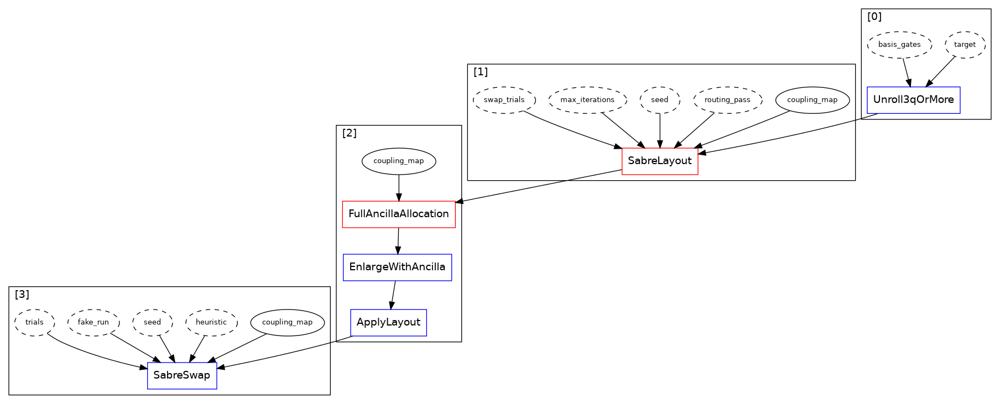

In [52]:
# Run Sabre with a single trial:

cmap = coupling_map=CouplingMap.from_grid(5, 5)
pm = StagedPassManager(stages=['layout', 'routing'])
layout_pass = SabreLayout(coupling_map=cmap, swap_trials=1, seed=42)
routing_pass = SabreSwap(coupling_map=cmap, trials=1, seed=42)

pm.pre_layout = PassManager([Unroll3qOrMore(basis_gates=['u', 'cx'])])
pm.layout = PassManager([layout_pass])
pm.post_layout = common.generate_embed_passmanager(cmap)
pm.routing = PassManager([routing_pass])
pm.draw()

In [53]:
from qiskit.circuit.library import QFT

qc = QFT(15)
res = pm.run(qc)

In [54]:
res.count_ops()

OrderedDict([('swap', 117), ('cp', 105), ('h', 15)])

In [55]:
# Run Sabre with 2000 trials
pm = StagedPassManager(stages=['layout', 'routing'])
layout_pass = SabreLayout(coupling_map=cmap, swap_trials=2000, seed=42)
routing_pass = SabreSwap(coupling_map=cmap, trials=2000, seed=42)

pm.pre_layout = PassManager([Unroll3qOrMore(basis_gates=['u', 'cx'])])
pm.layout = PassManager([layout_pass])
pm.post_layout = common.generate_embed_passmanager(cmap)
pm.routing = PassManager([routing_pass])

In [56]:
qc = QFT(15)
res = pm.run(qc)

In [57]:
res.count_ops()

OrderedDict([('cp', 105), ('swap', 82), ('h', 15)])

## Dynamic Circuits

The `QuantumCircuit` class in Qiskit now has support for control flow operations: `for_loop`, `while_loop`, and `if_else`. This enables executing parts of the quantum circuits based on classical control.

In [58]:
from qiskit import QuantumCircuit
from qiskit_aer import AerSimulator
import math

backend = AerSimulator(method="statevector")

qc = QuantumCircuit(1, 2)
qc.h(0)  # This is just a stand-in for more complex real-world setup.
qc.measure(0, 0);

### Conditionals

Unlike `c_if`, we can have more than one instruction in the block, and it only requires a single evaluation of the condition.  That's especially important if the bit is written to part way through the block.

In [59]:
with qc.if_test((0, True)):
    qc.reset(0)
    qc.x(0)
qc.measure(0, 1)

qc.draw()
backend.run(qc).result().get_counts()  # {'00': 0.5, '11': 0.5}

{'11': 504, '00': 520}

The `QuantumCircuit.if_test` context manager returns a context-manager
object that can be entered immediately on termination of the "true" body, to make an "else" body.  For example:

In [60]:
from qiskit.result import marginal_distribution

qc = QuantumCircuit(1, 2)
qc.h(0)
qc.measure(0, 0)
with qc.if_test((0, False)) as else_:
    qc.x(0)
with else_:
    qc.z(0)
qc.measure(0, 1)
counts = backend.run(qc).result().get_counts()
marginal_distribution(counts, [1])  # {'1': 1024}

{'1': 1024}

### Looping

Previously this wasn't representable in Qiskit at all, because we didn't have any concept of a run-time loop.

In [61]:
qc = QuantumCircuit(1, 2)
qc.h(0)
qc.measure(0, 0)
with qc.while_loop((0, False)):
    qc.reset(0)
    qc.h(0)
    qc.measure(0, 0)
qc.measure(0, 1)

qc.draw()
backend.run(qc).result().get_counts()  # {'11': 1}

{'11': 1024}

### Repeat until success, with limits on the number of iterations.

In [62]:
qc = QuantumCircuit(1, 2)
with qc.for_loop(range(2)):
    qc.reset(0)
    qc.h(0)
    qc.measure(0, 0)
    with qc.if_test((0, True)):
        # 'break' (and 'continue') is also supported by Aer, but isn't part
        # of the current transpiler support for swap routing.
        qc.break_loop()
qc.measure(0, 1)
backend.run(qc).result().get_counts()  # {'00': 0.25, '11': 0.75}

{'11': 752, '00': 272}

For loop also supports returning a `Parameter` for the loop index

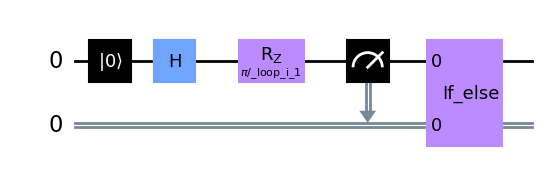

In [63]:
qc = QuantumCircuit(1, 2)
with qc.for_loop(range(2)) as i:
    qc.reset(0)
    qc.h(0)
    qc.rz(math.pi / i, 0)
    qc.measure(0, 0)
    with qc.if_test((0, True)):
        qc.break_loop()
qc.measure(0, 1)
# Draw the contents of the `for_loop_block`:
qc.data[0].operation.blocks[0].draw("mpl", cregbundle=False)

### Converting old-style c_if to IfElseOp.

This transpiler pass is available in Terra 0.22 for backends to use in their injected pass-manager stages, so they can begin transitioning to the new forms immediately, and can start deprecating support for handling old-style `condition`.

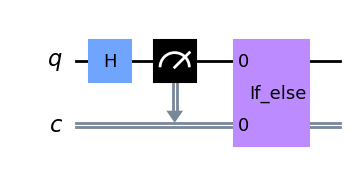

In [64]:
from qiskit.transpiler.passes import ConvertConditionsToIfOps

qc = QuantumCircuit(1, 1)
qc.h(0)
qc.measure(0, 0)
qc.x(0).c_if(0, False)
qc.draw()

converter_pass = ConvertConditionsToIfOps()
converter_pass(qc).draw("mpl", cregbundle=False)

### OpenQASM 3.0 Export

Dynamic circuits in `QuantumCircuit`s can be exported to QASM3 programs

In [65]:
from qiskit import qasm3

In [66]:
qc = QuantumCircuit(1, 2)
with qc.for_loop(range(2)) as i:
    qc.reset(0)
    qc.h(0)
    qc.rz(math.pi / i, 0)
    qc.measure(0, 0)
    with qc.if_test((0, True)):
        qc.break_loop()
qc.measure(0, 1)
print(qasm3.dumps(qc))

OPENQASM 3;
include "stdgates.inc";
bit[2] c;
qubit[1] _all_qubits;
let q = _all_qubits[0:0];
for _loop_i_2 in [0:1] {
  reset q[0];
  h q[0];
  rz(pi/_loop_i_2) q[0];
  c[0] = measure q[0];
  if (c[0] == 1) {
    break;
  }
}
c[1] = measure q[0];



### Transpiler support for Dynamic Circuits

`transpile()` has limited inital support for compiling circuits with control flow operations.

In [67]:
from qiskit.circuit import IfElseOp, ForLoopOp, WhileLoopOp
from qiskit.providers.fake_provider import FakeAuckland

backend = FakeAuckland()
backend.target.add_instruction(IfElseOp, name='if_else')
backend.target.add_instruction(ForLoopOp, name='for_loop')
backend.target.add_instruction(WhileLoopOp, name='while_loop')

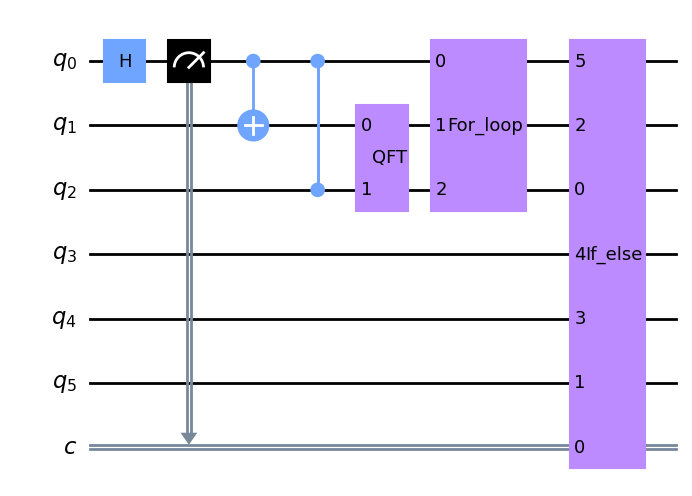

In [68]:
from qiskit.circuit.library import QFT

circuit = QuantumCircuit(6, 1)
circuit.h(0)
circuit.measure(0, 0)
circuit.cx(0, 1)
circuit.cz(0, 2)
circuit.append(QFT(2), [1, 2], [])
with circuit.for_loop((1,)):
    circuit.cx(0, 1)
    circuit.cz(0, 2)
    circuit.append(QFT(2), [1, 2], [])
with circuit.if_test((circuit.clbits[0], True)) as else_:
    circuit.cx(0, 1)
    circuit.cz(0, 2)
    circuit.append(QFT(2), [1, 2], [])
with else_:
    circuit.cx(3, 4)
    circuit.cz(3, 5)
    circuit.append(QFT(2), [4, 5], [])
    with circuit.while_loop((circuit.clbits[0], True)):
        circuit.cx(3, 4)
        circuit.cz(3, 5)
        circuit.append(QFT(2), [4, 5], [])
circuit.draw('mpl', cregbundle=False)

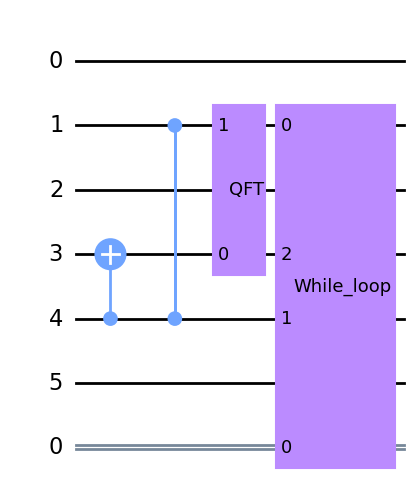

In [69]:
# Draw contents of else block:
circuit.data[-1].operation.blocks[-1].draw('mpl', cregbundle=False)

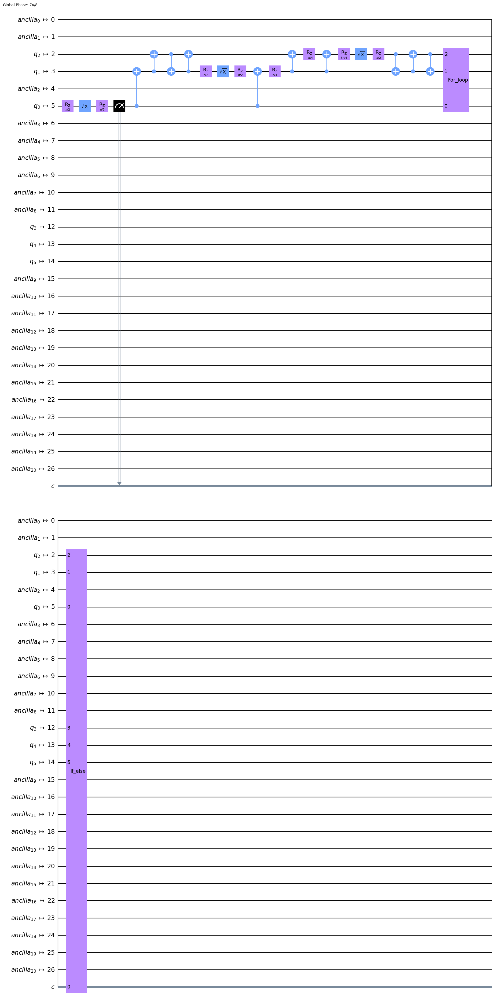

In [70]:
res = transpile(circuit, backend)
res.draw('mpl', cregbundle=False)

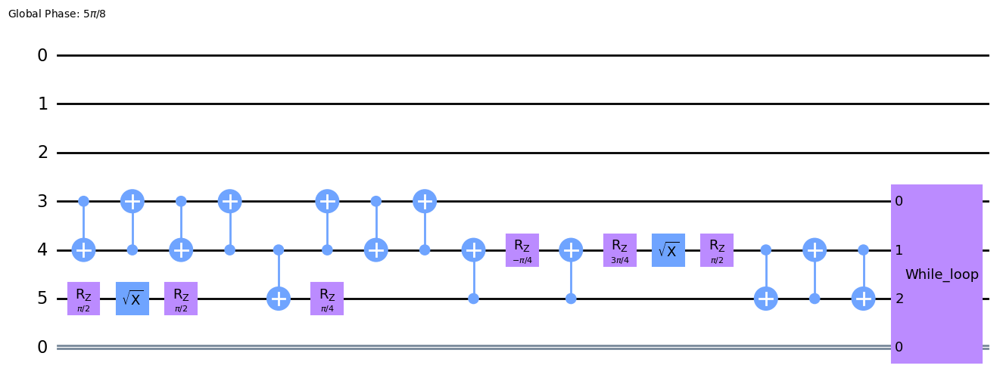

In [71]:
# Draw contents of transpiled else block:
res.data[-1].operation.blocks[-1].draw('mpl', cregbundle=False)

Only optimization levels 0 and 1 currently support compilation of control flow operations. For levels 2 and 3 an error will be raised:

In [72]:
from qiskit.transpiler import TranspilerError

try:
    transpile(circuit, backend, optimization_level=3)
except TranspilerError as ex:
    print(ex)

'The optimizations in optimization_level=3 do not yet support control flow.'


In [73]:
from qiskit.tools import jupyter
%qiskit_version_table

In [74]:
%qiskit_copyright